- cleaned up version of v2
- test on data with fixed PSF and samples independent from each other

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.keras
import sys
import os
import logging
import galsim
import random
import cmath as cm
import math
from tensorflow.keras import backend as K
from tensorflow.keras import metrics
from tensorflow.keras.layers import Input, Dense, Lambda, Layer, Add, Multiply, Reshape, Flatten, BatchNormalization
from tensorflow.keras.models import Model, Sequential
import scipy
import scipy.stats as stats
from astropy.io import fits
from astropy.cosmology import WMAP9 as cosmo
%matplotlib inline
from tensorflow.keras.layers import Conv2D, Input, Dense, Dropout, MaxPool2D, Flatten,  Reshape, UpSampling2D, Cropping2D, Conv2DTranspose, PReLU, Concatenate, Lambda, BatchNormalization, concatenate
import tensorflow as tf
import seaborn as sns

In [2]:
sys.path.insert(0,'../../scripts/tools_for_VAE/')
import tools_for_VAE

from tools_for_VAE import vae_functions, model, plot

from tools_for_VAE.model import build_encoder, build_decoder
from tools_for_VAE.utils import load_vae_conv, denorm, norm
from tools_for_VAE.plot import plot_rgb_lsst, plot_rgb_lsst_euclid, createCircularMask, mean_var, plot_corner_latent


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.



In [3]:
from tools_for_VAE.results_processing import VAE_processing

In [4]:
from importlib import reload
import generator_vae
reload(plot)
reload(generator_vae)

from tools_for_VAE.plot import plot_rgb_lsst, plot_rgb_lsst_euclid, createCircularMask, mean_var, plot_corner_latent

In [5]:
from generator_vae import BatchGenerator

# Loading the trained VAE

In [20]:
vae_lsst_r_band_conv, encoder_R, Dkl = load_vae_conv('/sps/lsst/users/barcelin/weights/R_band/VAE/noisy/v21/bis_bis/mse/',1, folder = True)

In [25]:
vae_lsst_conv, encoder_LSST, Dkl = load_vae_conv('/sps/lsst/users/barcelin/weights/LSST/VAE/noisy/v11/',6, folder= True) # v7 OK

In [6]:
vae_lsst_euclid_conv, encoder_LSST_EUCLID, Dkl = load_vae_conv('/sps/lsst/users/barcelin/weights/LSST_EUCLID/VAE/noisy/v8/bis/mse/',10, folder = True)

Instructions for updating:
Colocations handled automatically by placer.


# Generators

In [7]:
list_of_samples_new=['/sps/lsst/users/barcelin/data/single/PSF_lsst_O.65/independant/galaxies_test_v5.npy']

In [8]:
scale_radius = np.load('/sps/lsst/users/barcelin/data/single/PSF_lsst_O.65/independant/scale_radius_test_v5.npy', mmap_mode = 'c')

In [9]:
SNR = np.load('/sps/lsst/users/barcelin/data/single/PSF_lsst_O.65/independant/SNR_test_v5.npy')

In [10]:
bands_r = [6]

In [11]:
#batch_gen_old = BatchGenerator(bands_r, list_of_samples_old, total_sample_size=10000, batch_size= 100, size_of_lists = 10000, scale_radius = scale_radius,  trainval_or_test = 'training', noisy = True)

In [12]:
batch_gen_new = BatchGenerator(bands_r, list_of_samples_new, total_sample_size=10000, batch_size= 100, size_of_lists = 10000, scale_radius = scale_radius,SNR = SNR,  trainval_or_test = 'test', noisy = True)

In [13]:
bands_lsst = [4,5,6,7,8,9]

In [14]:
batch_gen_lsst = BatchGenerator(bands_lsst, list_of_samples_new,total_sample_size=10000, batch_size= 100, size_of_lists = 10000, scale_radius = scale_radius, SNR = SNR, trainval_or_test = 'test', noisy = True)#list_of_redshift,

In [15]:
bands_lsst_euclid = [0,1,2,3,4,5,6,7,8,9]

In [16]:
batch_gen_lsst_euclid = BatchGenerator(bands_lsst_euclid, list_of_samples_new,total_sample_size=10000, batch_size= 100, size_of_lists = 10000, scale_radius = scale_radius, SNR = SNR, trainval_or_test = 'test', noisy = True)#list_of_redshift,

In [17]:
phys_stamp_size = 6.4 # arcsec
pixel_scale_euclid_vis = 0.1 # arcsec/pixel

stamp_size = int(phys_stamp_size/pixel_scale_euclid_vis)

# Test plot vae R band only

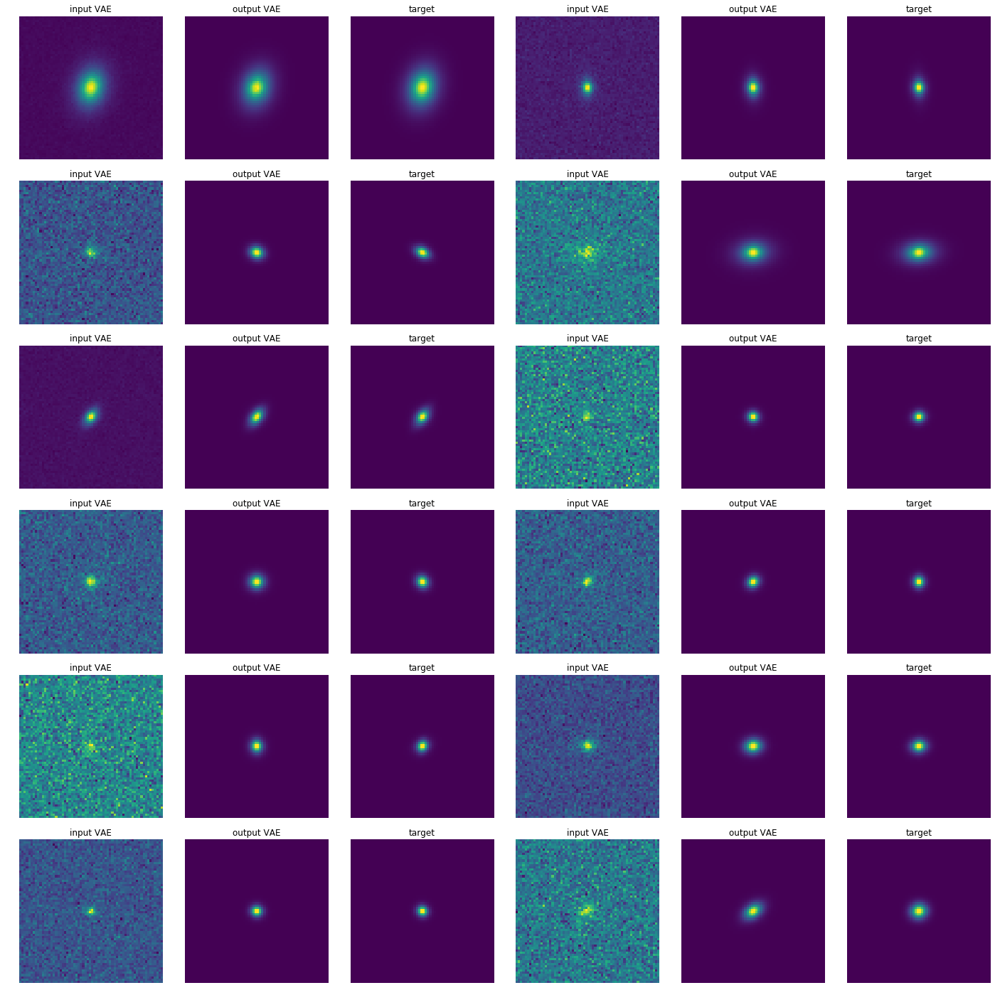

In [21]:
N_plot = 6
fig, axes = plt.subplots(N_plot, N_plot, figsize=(25, 25))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

input_vae = batch_gen_new.__getitem__(2)
output_vae = vae_lsst_r_band_conv.predict(input_vae[0], batch_size = 100)

input_noisy = denorm(input_vae[0], bands_r, channel_last = True)
input_noiseless = denorm(input_vae[1], bands_r, channel_last = True)
output_vae = denorm(output_vae, bands_r, channel_last = True)

for i in range(N_plot):
    for j in range(0,N_plot,3):
        
        axes[i,j].imshow(input_noisy[indices[i*N_plot+j]].reshape((64,64)))
        axes[i,j+1].imshow(output_vae[indices[i*N_plot+j]].reshape((64,64)))
        axes[i,j+2].imshow(input_noiseless[indices[i*N_plot+j]].reshape((64,64)))

        axes[i,j].axis('off')
        axes[i,j].set_title('input VAE')
        axes[i,j+1].axis('off')
        axes[i,j+1].set_title('output VAE')
        axes[i,j+2].axis('off')
        axes[i,j+2].set_title('target')

/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


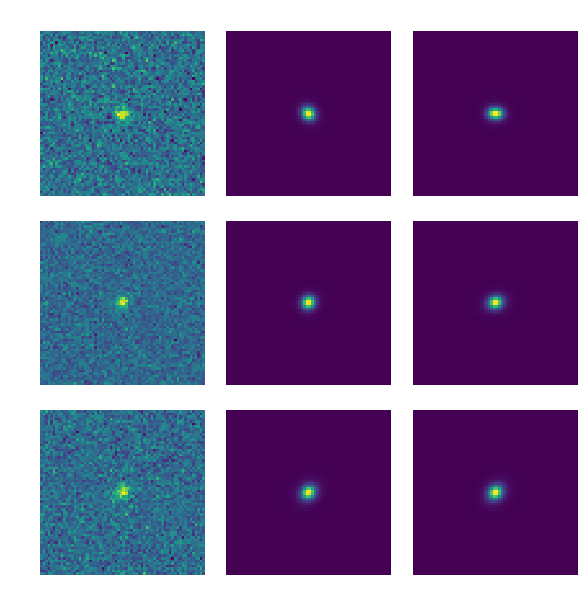

In [19]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)


N_plot = 3
fig, axes = plt.subplots(3, N_plot, figsize=(10, 10))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

input_vae = batch_gen_new.__getitem__(2)
output_vae = vae_lsst_r_band_conv.predict(input_vae[0], batch_size = 100)
#print(np.max(output_vae, axis = (1,2)))
input_noisy = denorm(input_vae[0], bands_r, channel_last = True)
input_noiseless = denorm(input_vae[1], bands_r, channel_last = True)
output_vae = denorm(output_vae, bands_r, channel_last = True)

for i in range(3):
    for j in range(0,N_plot,3):
        axes[i,j].imshow(input_noisy[indices[i*N_plot+j]].reshape((64,64)))
        axes[i,j+1].imshow(output_vae[indices[i*N_plot+j]].reshape((64,64)))
        axes[i,j+2].imshow(input_noiseless[indices[i*N_plot+j]].reshape((64,64)))
        
        axes[i,j].axis('off')
        axes[i,j].set_title('input VAE', color = "w")
        axes[i,j+1].axis('off')
        axes[i,j+1].set_title('output VAE', color = "w")
        axes[i,j+2].axis('off')
        axes[i,j+2].set_title('target', color = "w")

# Test plot for LSST all filters

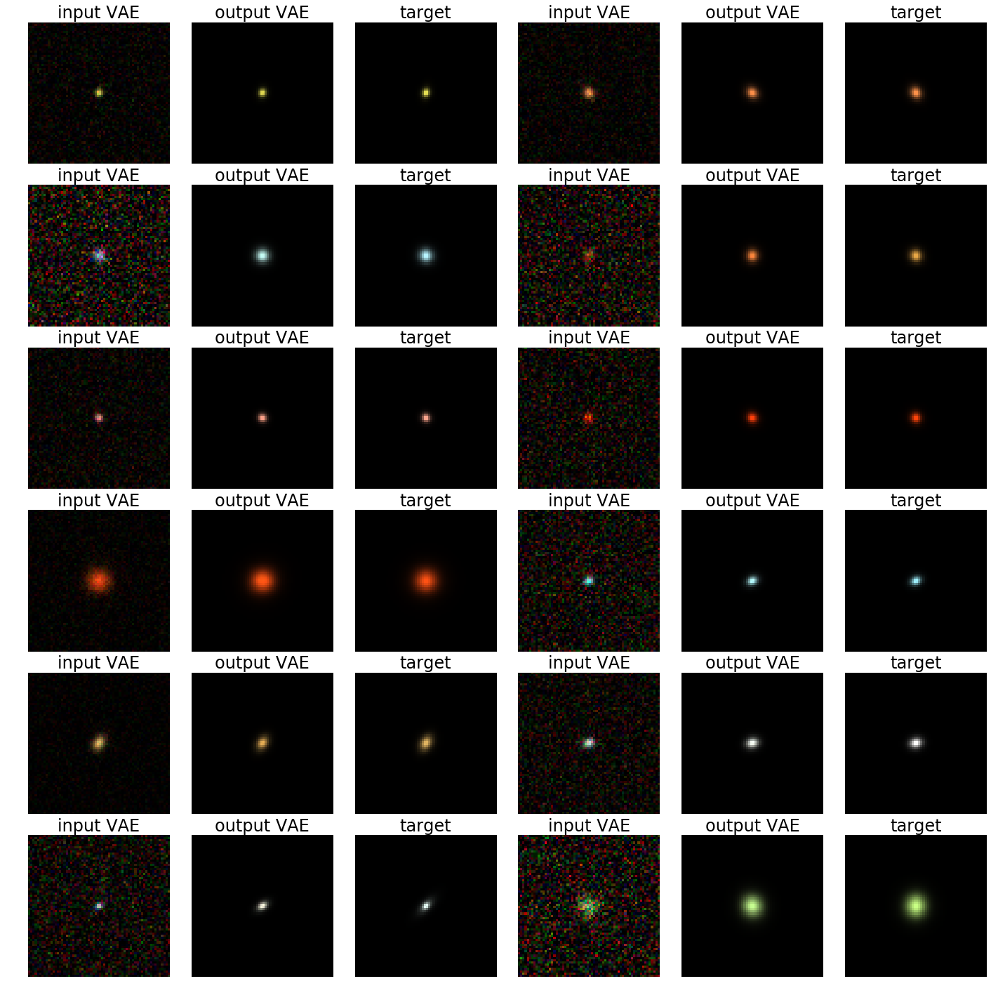

In [27]:
N_plot = 6
fig, axes = plt.subplots(N_plot, N_plot, figsize=(25, 25))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

input_vae = batch_gen_lsst.__getitem__(2)
output_vae = vae_lsst_conv.predict(input_vae[0], batch_size = 100)

input_noisy = denorm(input_vae[0], bands_lsst, channel_last = True)
input_noiseless = denorm(input_vae[1], bands_lsst, channel_last = True)
output_vae = denorm(output_vae, bands_lsst, channel_last = True)

for i in range(N_plot):
    for j in range(0,N_plot,3):
        
        plot_rgb_lsst(input_noisy[indices[i*N_plot+j]], stamp_size, axes[i,j])
        plot_rgb_lsst(output_vae[indices[i*N_plot+j]], stamp_size, axes[i,j+1])
        plot_rgb_lsst(input_noiseless[indices[i*N_plot+j]], stamp_size, axes[i,j+2])

        axes[i,j].axis('off')
        axes[i,j].set_title('input VAE')
        axes[i,j+1].axis('off')
        axes[i,j+1].set_title('output VAE')
        axes[i,j+2].axis('off')
        axes[i,j+2].set_title('target')

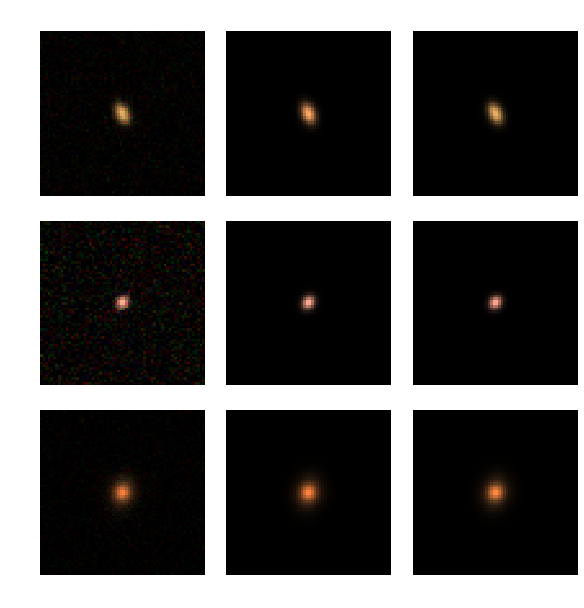

In [28]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)

N_plot = 3
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

input_vae = batch_gen_lsst.__getitem__(2)
output_vae = vae_lsst_conv.predict(input_vae[0], batch_size = 100)

input_noisy = denorm(input_vae[0], bands_lsst, channel_last = True)
input_noiseless = denorm(input_vae[1], bands_lsst, channel_last = True)
output_vae = denorm(output_vae, bands_lsst, channel_last = True)

for i in range(3):
    for j in range(0,N_plot,3):
        
        plot_rgb_lsst(input_noisy[indices[i*N_plot+j]], stamp_size, axes[i,j])
        plot_rgb_lsst(output_vae[indices[i*N_plot+j]], stamp_size, axes[i,j+1])
        plot_rgb_lsst(input_noiseless[indices[i*N_plot+j]], stamp_size, axes[i,j+2])
        
        axes[i,j].axis('off')
        axes[i,j].set_title('input VAE', color = "w")
        axes[i,j+1].axis('off')
        axes[i,j+1].set_title('output VAE', color = "w")
        axes[i,j+2].axis('off')
        axes[i,j+2].set_title('target', color = "w")

# Test plot for LSST+Euclid filters

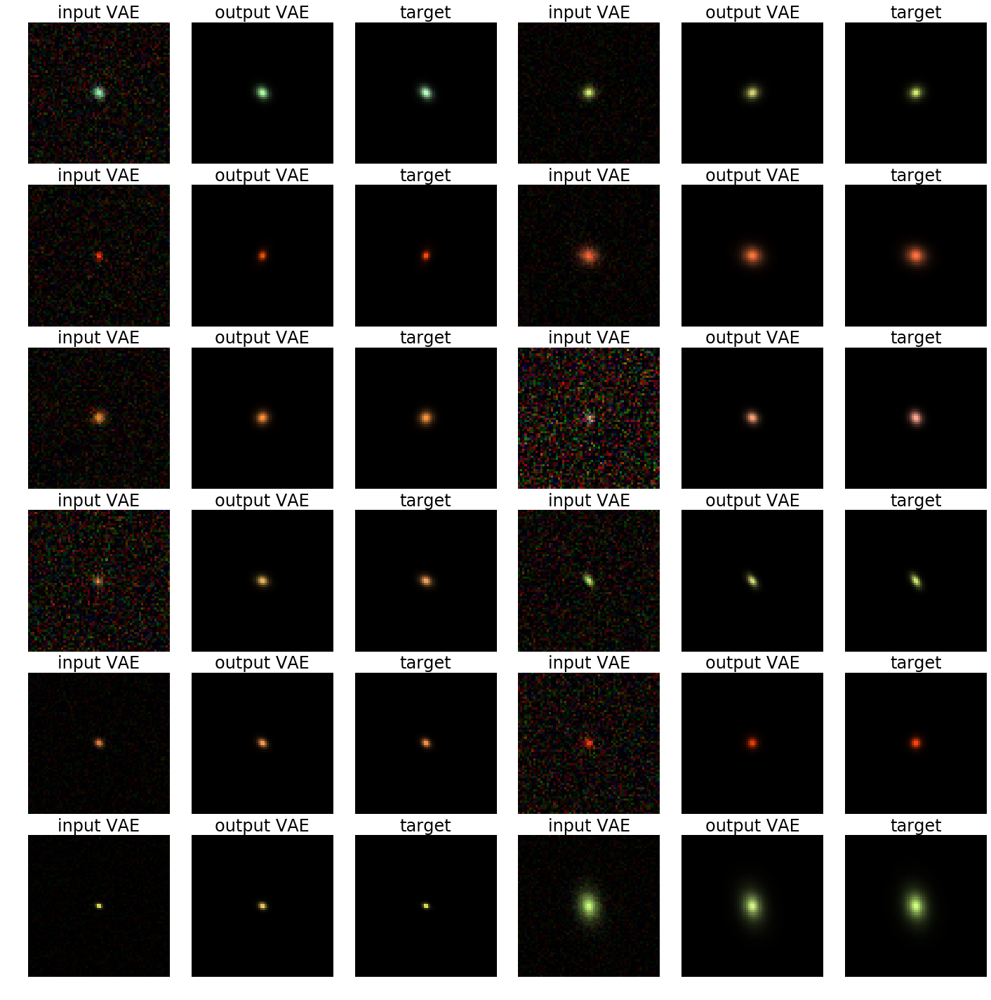

In [31]:
N_plot = 6
fig, axes = plt.subplots(N_plot, N_plot, figsize=(25, 25))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

input_vae = batch_gen_lsst_euclid.__getitem__(2)
output_vae = vae_lsst_euclid_conv.predict(input_vae[0], batch_size = 100)


#input_noisy = input_vae[0]
#input_noiseless = input_vae[1]
input_noisy = denorm(input_vae[0], bands_lsst_euclid, channel_last = True)
input_noiseless = denorm(input_vae[1], bands_lsst_euclid, channel_last = True)
output_vae = denorm(output_vae, bands_lsst_euclid, channel_last = True)

for i in range(N_plot):
    for j in range(0,N_plot,3):

        plot_rgb_lsst_euclid(input_noisy[indices[i*N_plot+j]], stamp_size, axes[i,j])
        plot_rgb_lsst_euclid(output_vae[indices[i*N_plot+j]], stamp_size, axes[i,j+1])
        plot_rgb_lsst_euclid(input_noiseless[indices[i*N_plot+j]], stamp_size, axes[i,j+2])

        axes[i,j].axis('off')
        axes[i,j].set_title('input VAE')
        axes[i,j+1].axis('off')
        axes[i,j+1].set_title('output VAE')
        axes[i,j+2].axis('off')
        axes[i,j+2].set_title('target')

## VAE LSST R band

Test of data processing functions

In [22]:
N = 100
batch_size = 100

In [23]:
ellipticities_r_band, e_beta, lum_in_simple_r, lum_out_simple_r, scale_radius, SNR = VAE_processing(vae_lsst_r_band_conv, batch_gen_new,bands_r,0,stamp_size, N, batch_size)

Text(0, 0.5, 'e of output galaxy')

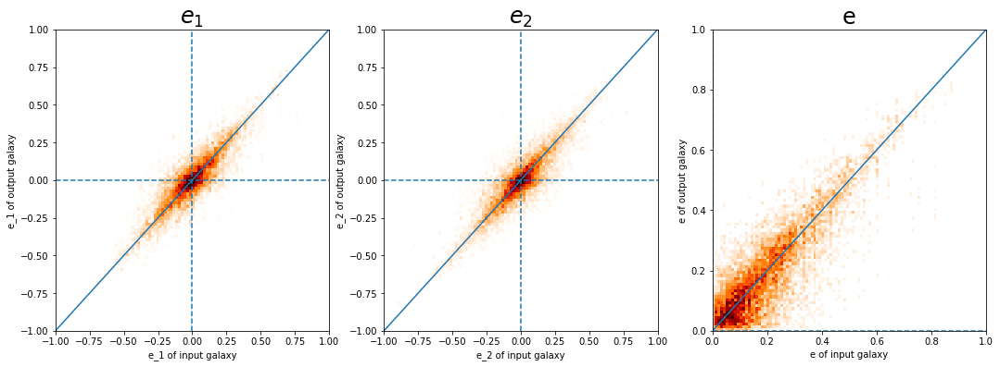

In [24]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

_ = axes[2].hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')

In [44]:
np.pi

3.141592653589793

Text(0, 0.5, 'e of output galaxy')

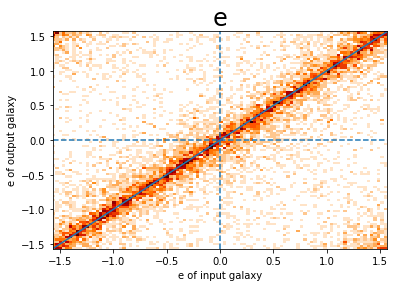

In [25]:
emax = np.pi/2
_ = plt.hist2d(e_beta[:,0,1], e_beta[:,1,1], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
plt.plot([-emax,+emax],[-emax,+emax])
plt.axhline(y=0, ls='--')
plt.axvline(x=0, ls='--')
plt.title('e'.format(i+1),fontsize=24)# color="w", 
plt.tick_params(axis='x')#, colors='w'
plt.tick_params(axis='y')#, colors='w'
plt.xlabel('e of input galaxy')
plt.ylabel('e of output galaxy')

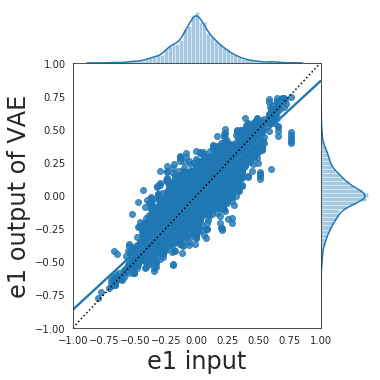

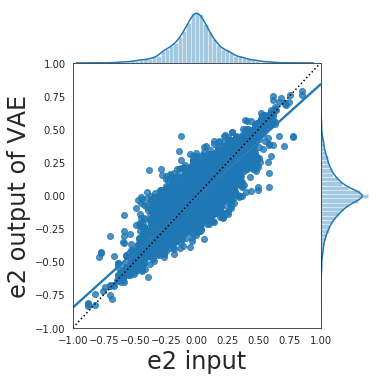

In [26]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

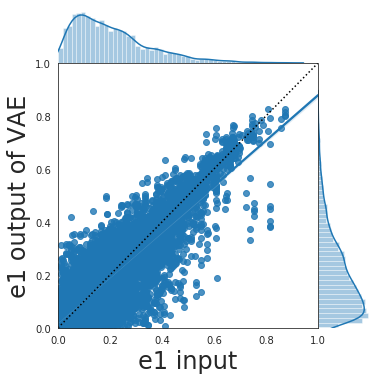

In [27]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta[:,0,0], e_beta[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


(0, 200)

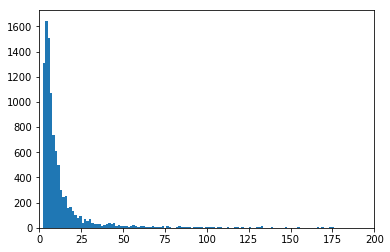

In [31]:
_ = plt.hist(SNR, bins = 1000)
plt.xlim(0,200)

In [47]:
weak_snr = np.where(SNR<6)

In [48]:
weak_snr[0].shape

(4131,)

In [49]:
weak_snr[0]

array([   5,    7,    9, ..., 9995, 9998, 9999])

In [50]:
ellipticities_r_band.shape

(10000, 2, 2)

In [51]:
ellipticities_r_band_mod = np.delete(ellipticities_r_band[:], weak_snr[0], axis = 0)

In [52]:
ellipticities_r_band_mod.shape

(5869, 2, 2)

In [55]:
e_beta_mod = np.delete(e_beta, weak_snr[0], axis = 0)

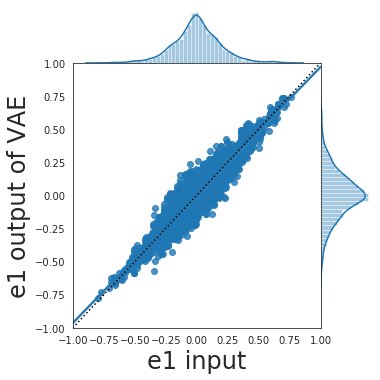

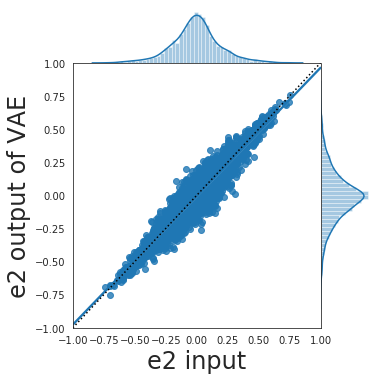

In [53]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band_mod[:,0,0], ellipticities_r_band_mod[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band_mod[:,0,1], ellipticities_r_band_mod[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

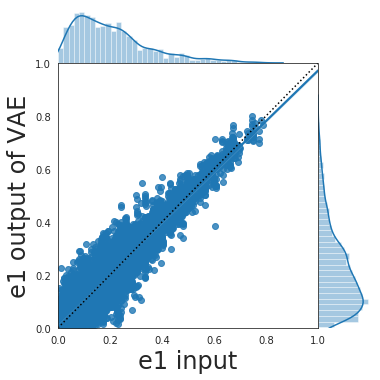

In [56]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta_mod[:,0,0], e_beta_mod[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


Test avec 3 filtres et lr = 10-3, alpha = 10-2

Text(0, 0.5, 'e of output galaxy')

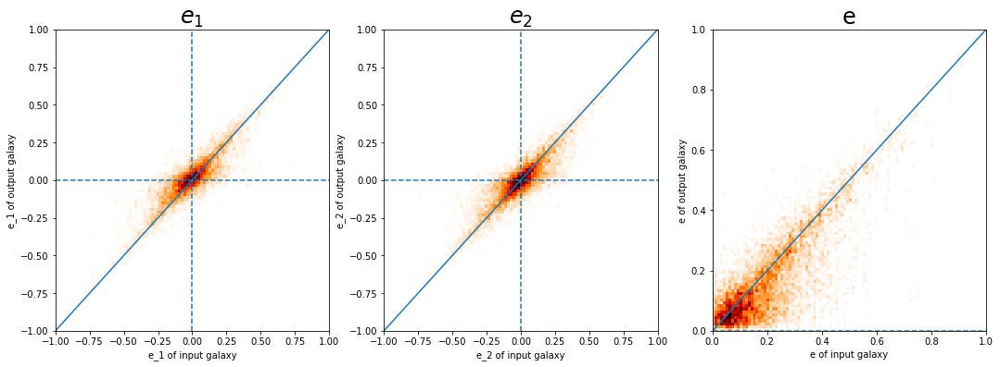

In [21]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

_ = axes[2].hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')


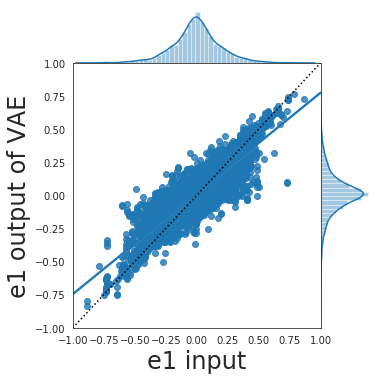

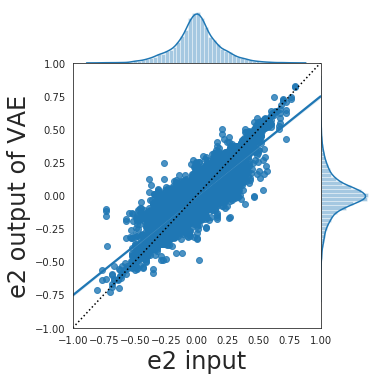

In [22]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

### Shape plots

alpha de 10-2 à 10-8

Text(0, 0.5, 'e of output galaxy')

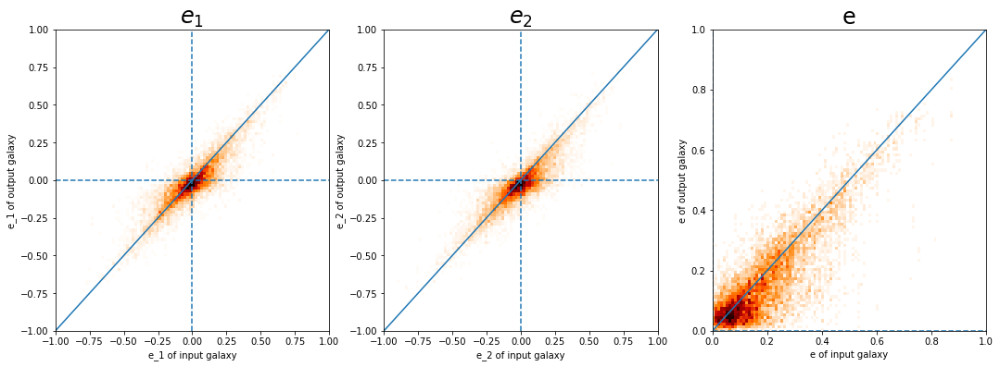

In [22]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

_ = axes[2].hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')


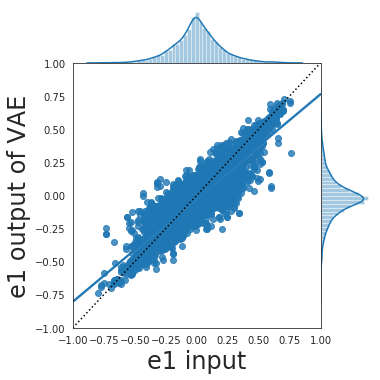

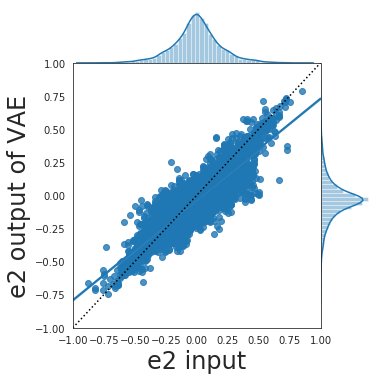

In [23]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

alpha 10-2

Text(0, 0.5, 'e of output galaxy')

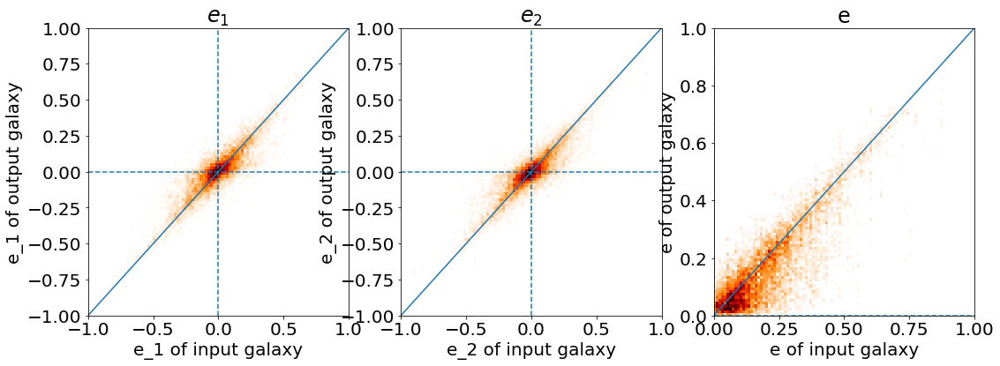

In [26]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

_ = axes[2].hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')


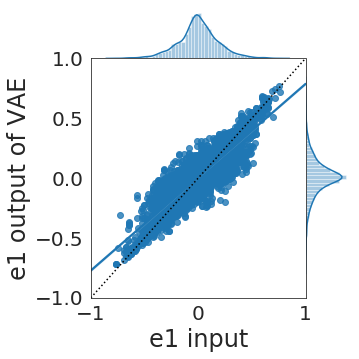

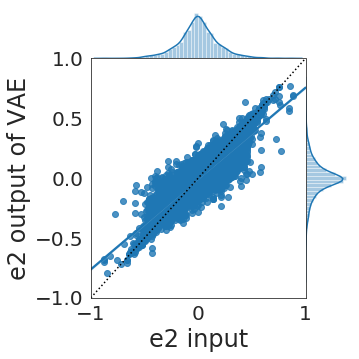

In [27]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

Text(0, 0.5, 'e1 of reproduced galaxy')

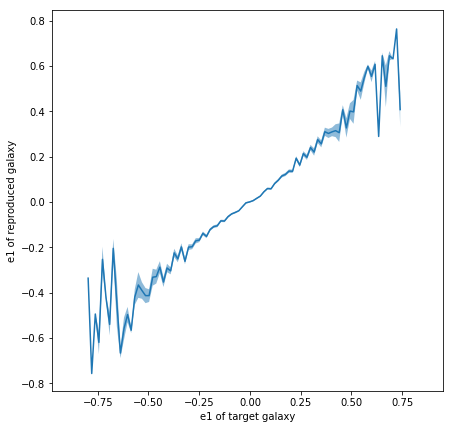

In [42]:
mean_ellipticity, var_ellipticity = mean_var(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], bins = 100)

x = np.linspace(np.min(ellipticities_r_band[:,0,0]), np.max(ellipticities_r_band[:,0,0]), 100)
mid = (x[0:]+x[:])*0.5


fig, axes = plt.subplots(1, figsize=(7,7))

plt.plot(mid,mean_ellipticity)
plt.fill_between(mid, mean_ellipticity - var_ellipticity**0.5, mean_ellipticity + var_ellipticity**0.5, alpha=0.5)
plt.xlabel('e1 of target galaxy')
plt.ylabel('e1 of reproduced galaxy')
#plt.ylim(-6,4)

In [43]:
print(mean_ellipticity)

[-6.25551283e-01             nan             nan             nan
             nan -3.36741894e-01 -7.57232249e-01 -4.94771034e-01
 -6.19992621e-01 -2.53715925e-01 -4.25102904e-01 -5.40590177e-01
 -2.05247931e-01 -4.44500834e-01 -6.67003083e-01 -5.58999391e-01
 -4.97287931e-01 -5.66348499e-01 -4.20204293e-01 -3.66736288e-01
 -3.91071836e-01 -4.13651671e-01 -4.13692978e-01 -3.32414986e-01
 -3.29897081e-01 -2.88016077e-01 -3.53837124e-01 -2.91752610e-01
 -3.04575022e-01 -2.25197087e-01 -2.51533605e-01 -1.98855661e-01
 -2.62226854e-01 -1.99646045e-01 -1.98007447e-01 -1.71994371e-01
 -1.68607331e-01 -1.38980306e-01 -1.52408388e-01 -1.22253573e-01
 -1.09343809e-01 -1.05550962e-01 -8.38161081e-02 -8.46793010e-02
 -6.54300873e-02 -5.32807238e-02 -4.68119295e-02 -3.94173593e-02
 -2.17031159e-02 -4.41018467e-03 -3.93811032e-04  5.34721143e-03
  1.55270733e-02  2.52902999e-02  4.43015581e-02  5.87616188e-02
  5.75679515e-02  8.08420267e-02  9.53492755e-02  1.14006005e-01
  1.20927855e-01  1.35732

In [44]:
for i in range (len(mean_ellipticity)):
    if mean_ellipticity[i]=='nan':
        np.delete(mid,[i])

In [45]:
len(mid)

100

In [46]:
mean_ellipticity = mean_ellipticity[np.logical_not(np.isnan(mean_ellipticity))]

In [47]:
x = np.linspace(np.min(ellipticities_r_band[:,0,0]), np.max(ellipticities_r_band[:,0,0]), len(mean_ellipticity))
mid = (x[0:]+x[:])*0.5

In [48]:
mean_ellipticity

array([-6.25551283e-01, -3.36741894e-01, -7.57232249e-01, -4.94771034e-01,
       -6.19992621e-01, -2.53715925e-01, -4.25102904e-01, -5.40590177e-01,
       -2.05247931e-01, -4.44500834e-01, -6.67003083e-01, -5.58999391e-01,
       -4.97287931e-01, -5.66348499e-01, -4.20204293e-01, -3.66736288e-01,
       -3.91071836e-01, -4.13651671e-01, -4.13692978e-01, -3.32414986e-01,
       -3.29897081e-01, -2.88016077e-01, -3.53837124e-01, -2.91752610e-01,
       -3.04575022e-01, -2.25197087e-01, -2.51533605e-01, -1.98855661e-01,
       -2.62226854e-01, -1.99646045e-01, -1.98007447e-01, -1.71994371e-01,
       -1.68607331e-01, -1.38980306e-01, -1.52408388e-01, -1.22253573e-01,
       -1.09343809e-01, -1.05550962e-01, -8.38161081e-02, -8.46793010e-02,
       -6.54300873e-02, -5.32807238e-02, -4.68119295e-02, -3.94173593e-02,
       -2.17031159e-02, -4.41018467e-03, -3.93811032e-04,  5.34721143e-03,
        1.55270733e-02,  2.52902999e-02,  4.43015581e-02,  5.87616188e-02,
        5.75679515e-02,  

In [49]:
from scipy import optimize

def test_func(x, a, b,c,d):
    return a*x**3 + b*x**2 + c*x + d

params, params_covariance = optimize.curve_fit(test_func, mid,mean_ellipticity)

print(params)

[-0.05853892  0.06511107  0.7294529   0.00171102]


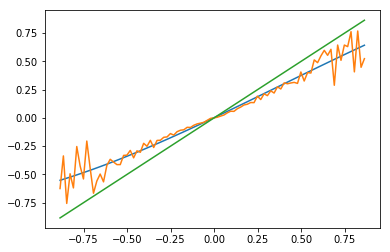

In [50]:
plt.plot(mid,test_func(mid,params[0],params[1],params[2],params[3]))
plt.plot(mid,mean_ellipticity)
plt.plot(mid,mid)

In [51]:
from scipy import optimize

def test_func(x, a, b):
    return a*x + b

params, params_covariance = optimize.curve_fit(test_func, mid,mean_ellipticity)

print(params)

[0.70056687 0.01887622]


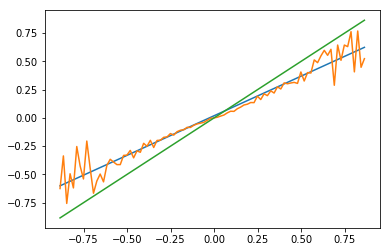

In [52]:
plt.plot(mid,test_func(mid,params[0],params[1]))
plt.plot(mid,mean_ellipticity)
plt.plot(mid,mid)

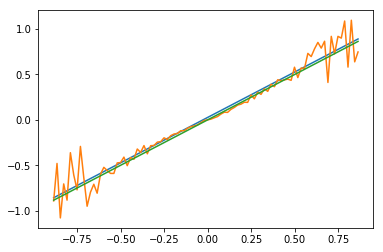

In [53]:
plt.plot(mid,test_func(mid,params[0],params[1])/params[0])
plt.plot(mid,mean_ellipticity/params[0])
plt.plot(mid,mid)

In [54]:
from scipy import optimize

def test_func(x, a, c):
    return a*np.tan(x) + c

params, params_covariance = optimize.curve_fit(test_func, mid,mean_ellipticity)

print(params)

[0.57671236 0.01989997]


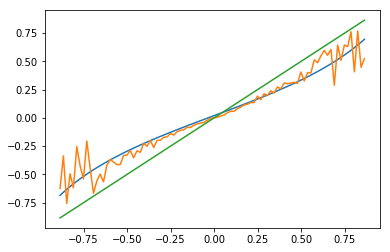

In [55]:
plt.plot(mid,test_func(mid,params[0],params[1]))
plt.plot(mid,mean_ellipticity)
plt.plot(mid,mid)

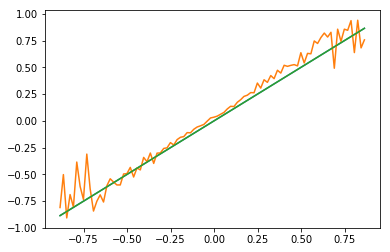

In [56]:
plt.plot(mid,np.arctan((test_func(mid,params[0],params[1])-params[1])/params[0]))
plt.plot(mid,np.arctan((mean_ellipticity+params[1])/params[0]))
plt.plot(mid,mid)

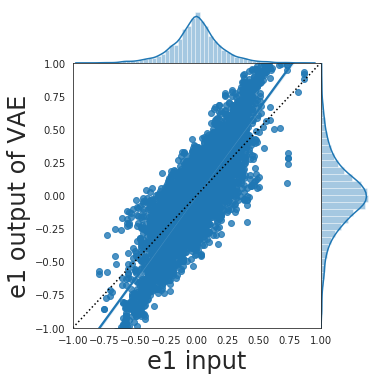

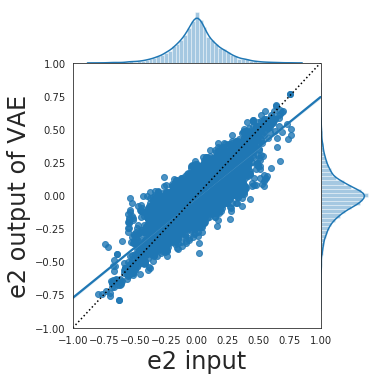

In [57]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0]/params[0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

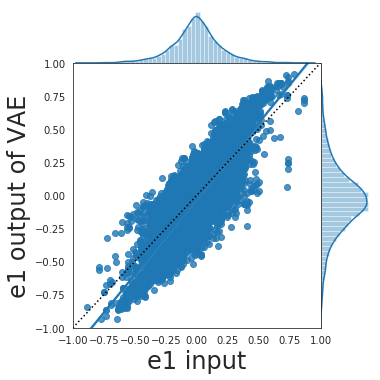

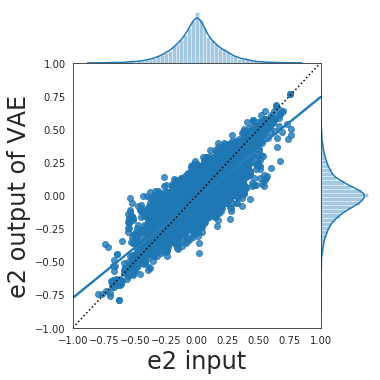

In [58]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], np.arctan((ellipticities_r_band[:,1,0]-params[1])/params[0]), kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

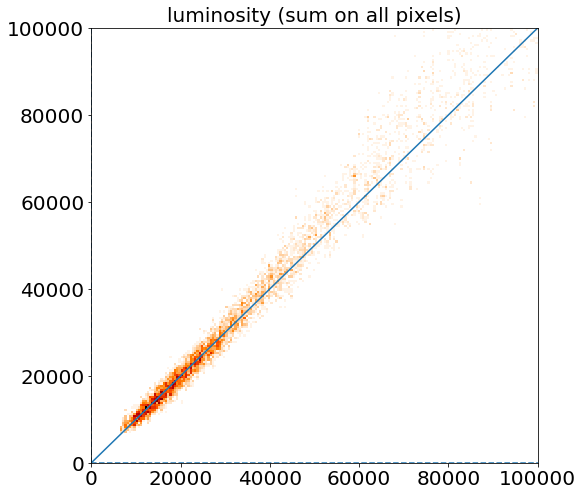

In [28]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(8,8))
emax = 100000
_ = axes.hist2d(lum_in_simple_r, lum_out_simple_r, bins=np.linspace(0,+emax,200), cmap=mpl.cm.gist_heat_r)
axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')

alpha 10-3

Text(0, 0.5, 'e of output galaxy')

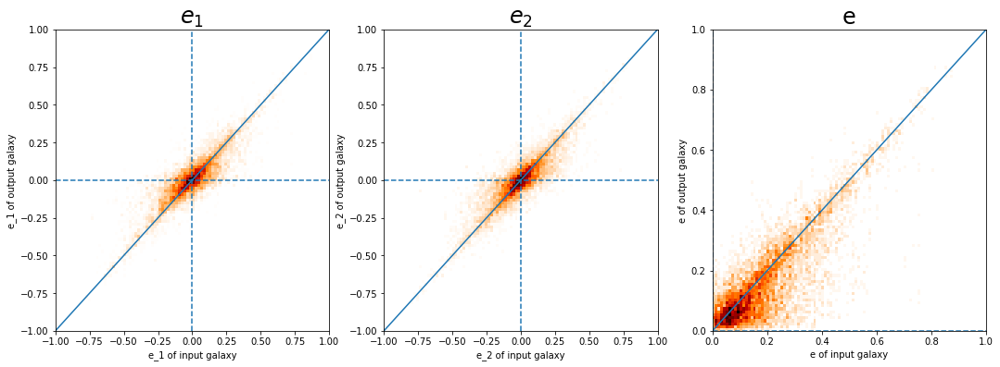

In [20]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

_ = axes[2].hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')


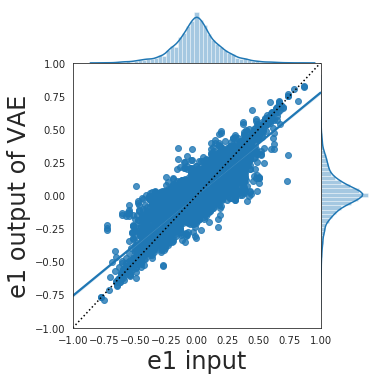

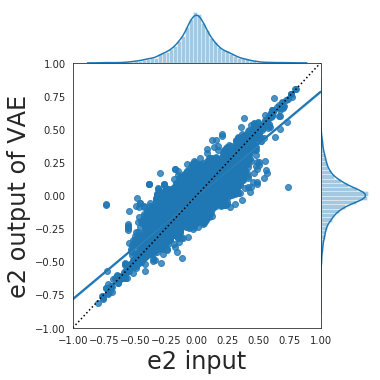

In [21]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

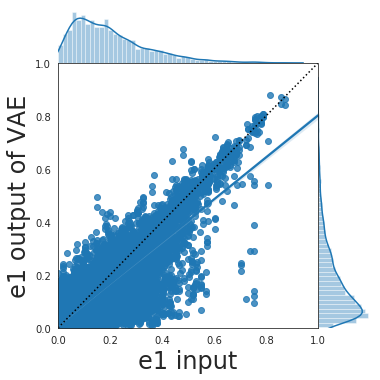

In [22]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta[:,0,0], e_beta[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


1 700 000 galaxies as training sample

Text(0, 0.5, 'e of output galaxy')

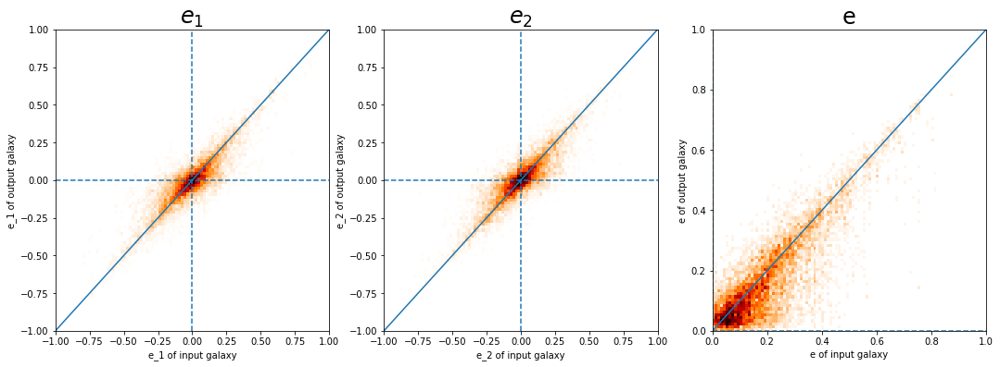

In [22]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

_ = axes[2].hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')


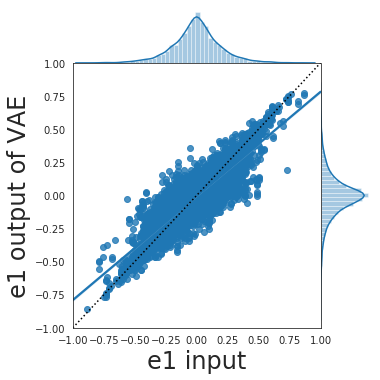

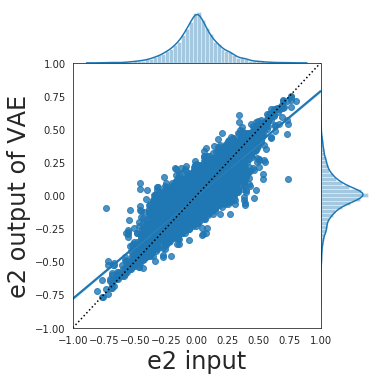

In [23]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

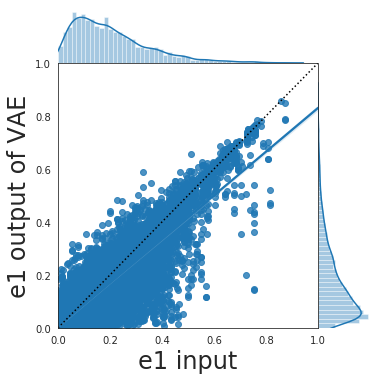

In [24]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta[:,0,0], e_beta[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


Alpha 10-3 again

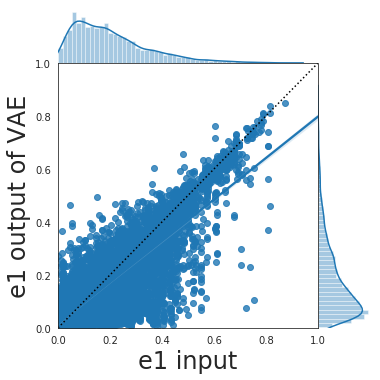

In [83]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta[:,0,0], e_beta[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


In [84]:
delta_e = e_beta[:,0,0]- e_beta[:,1,0]

In [85]:
len(delta_e), len(scale_radius), len(SNR)

(10000, 10000, 10000)

In [86]:
delta_e_rel = delta_e[:]/e_beta[:,0,0]

In [ ]:
import matplotlib as mpl
fig, axes = plt.subplots(1,2, figsize=(20,10))

im = axes[0].scatter(e_beta[:,0,0], np.log(SNR),  c = np.log(np.abs(delta_e_rel)), s=10)#, cmap=mpl.cm.gist_heat_r)#c = delta_e1,
axes[0].set_xlabel("Ellipticity of target")
axes[0].set_ylabel("SNR")#delta r to closest (arcsecond)/scale radius of centered
#plt.xscale('log')
axes[0].set_xlim(0,1)
fig.colorbar(im, ax=axes[0])

im = axes[1].scatter(scale_radius, np.log(SNR),  c = np.log(np.abs(delta_e_rel)), s=10)#, cmap=mpl.cm.gist_heat_r)#c = delta_e1,
axes[1].set_xlabel("Scale radius of target")
axes[1].set_ylabel("SNR")#delta r to closest (arcsecond)/scale radius of centered
#plt.xscale('log')
axes[1].set_xlim(0,1)
fig.colorbar(im, ax=axes[1])

In [127]:
np.mean(delta_e_rel)

-1.5214794106344964

(-6, 4)

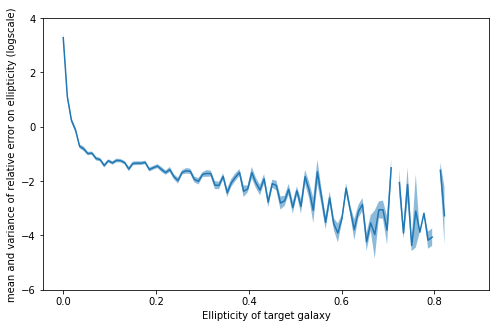

In [93]:
mean_delta, var_delta = mean_var(e_beta[:,0,0],np.log(np.abs(delta_e_rel)), bins = 100)

x = np.linspace(np.min(e_beta[:,0,0]), np.max(e_beta[:,0,0]), 100)
mid = (x[0:]+x[:])*0.5


mean_SNR, var_SNR = mean_var(np.log(SNR),np.log(np.abs(delta_e_rel)), bins = 100)

x_snr = np.linspace(np.min(np.log(SNR)), np.max(np.log(SNR)), 100)
mid_snr = (x_snr[0:]+x_snr[:])*0.5

mean_radius, var_radius = mean_var(scale_radius,np.log(np.abs(delta_e_rel)), bins = 100)

x_radius = np.linspace(np.min(scale_radius), np.max(scale_radius), 100)
mid_radius = (x_radius[0:]+x_radius[:])*0.5




fig, axes = plt.subplots(1,3, figsize=(21,7))

axes[0].plot(mid,mean_delta)
axes[0].fill_between(mid, mean_delta - var_delta**0.5, mean_delta + var_delta**0.5, alpha=0.5)
axes[0].set_xlabel('Ellipticity of target galaxy')
axes[0].set_ylabel('mean and variance of relative error on ellipticity (logscale)')
axes[0].set_ylim(-6,4)


axes[1].plot(mid_snr,mean_SNR)
plt.fill_between(mid_snr, mean_SNR - var_SNR**0.5, mean_SNR + var_SNR**0.5, alpha=0.5)
axes[1].set_xlabel('SNR (logscale)')
axes[1].set_ylabel('mean and variance of relative error on ellipticity (logscale)')
axes[1].set_ylim(-6,0.5)


axes[2].plot(mid_radius,mean_radius)
axes[2].fill_between(mid_radius, mean_radius - var_radius**0.5, mean_radius + var_radius**0.5, alpha=0.5)

axes[2].xlabel('scale radius of target')
axes[2].ylabel('mean and variance of relative error on ellipticity (logscale)')
axes[2].ylim(-6,0.5)

Alpha from 10-4 to 10-6

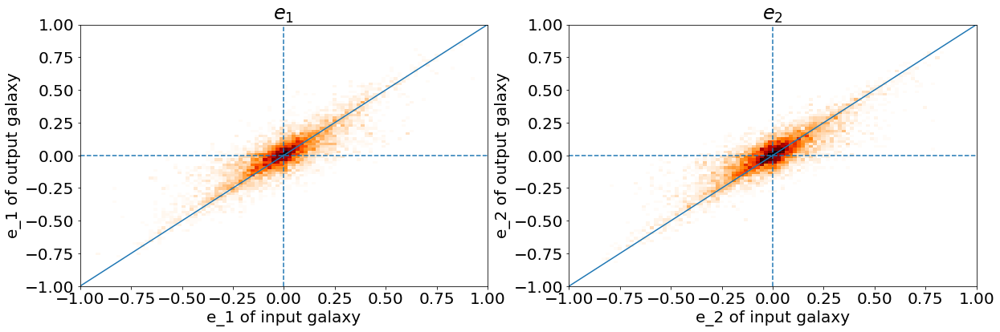

In [35]:
import matplotlib as mpl

fig, axes = plt.subplots(1,2, figsize=(20,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

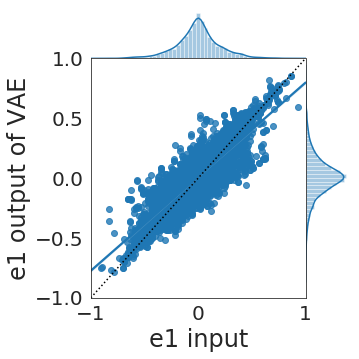

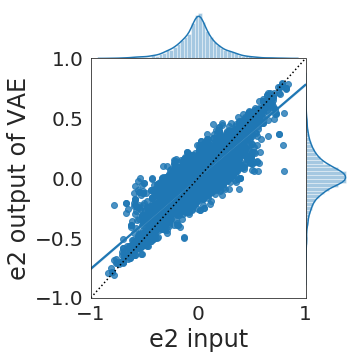

In [36]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

Alpha 10-4

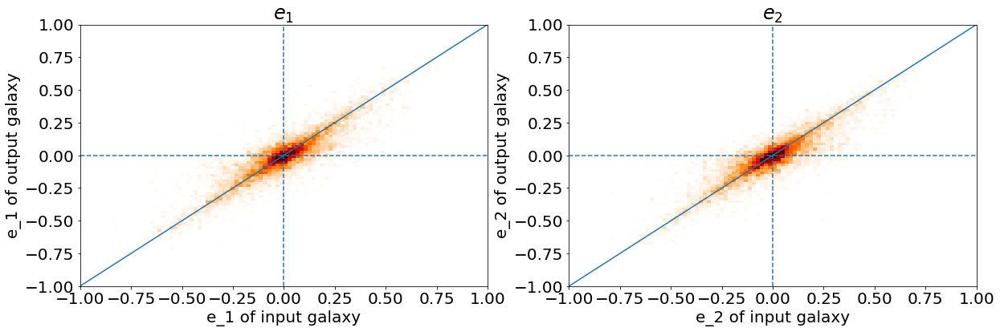

In [66]:
import matplotlib as mpl

fig, axes = plt.subplots(1,2, figsize=(20,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

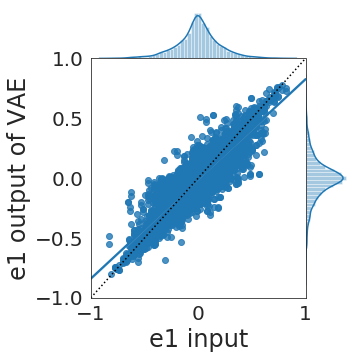

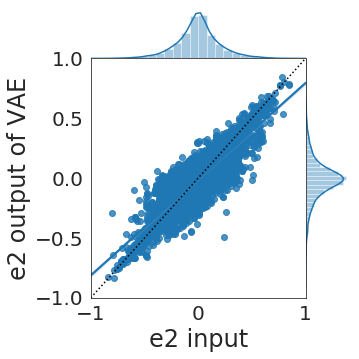

In [67]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

Alpha 10-2

Text(0, 0.5, 'e of output galaxy')

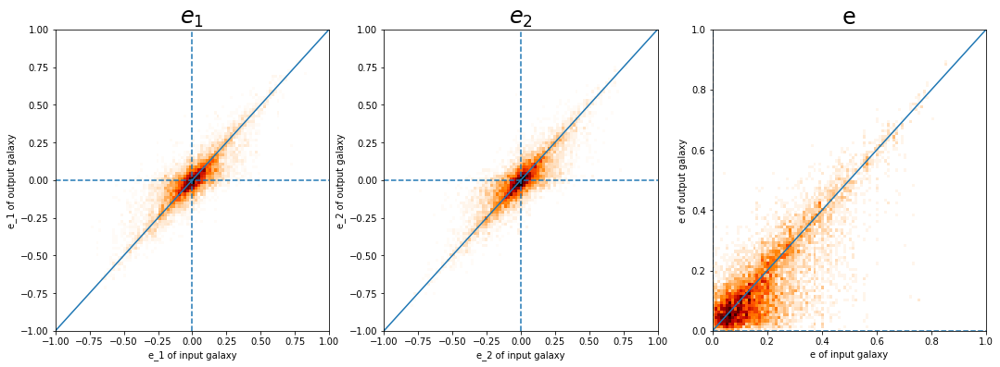

In [21]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')
    
_ = axes[2].hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')

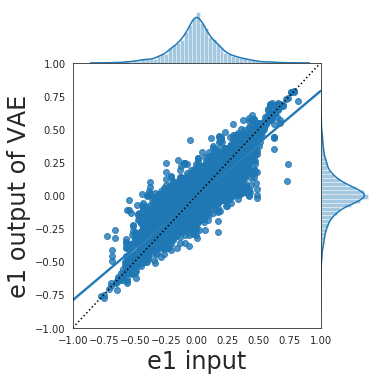

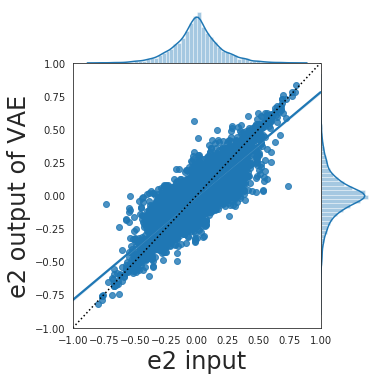

In [22]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

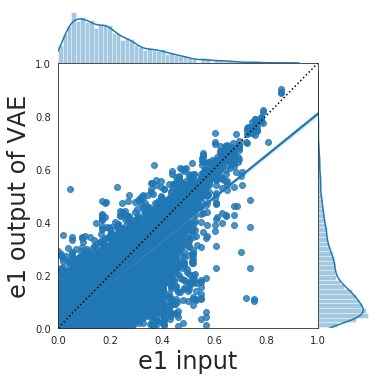

In [23]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta[:,0,0], e_beta[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


Alpha 10-1

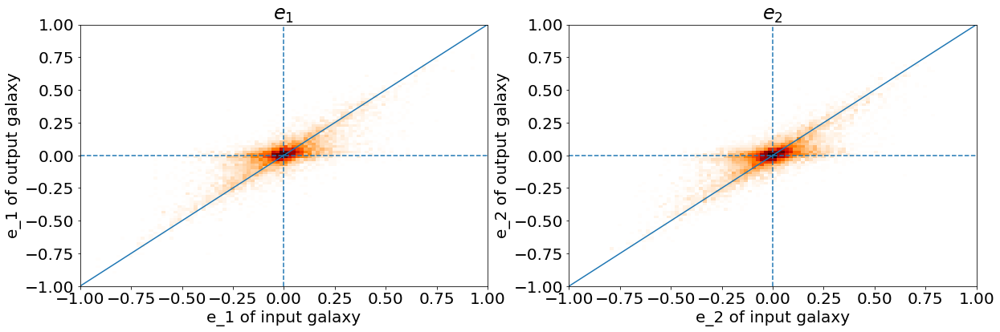

In [106]:
import matplotlib as mpl

fig, axes = plt.subplots(1,2, figsize=(20,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_r_band[:,0,i], ellipticities_r_band[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1),fontsize=24)# color="w", 
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w'
    axes[i].tick_params(axis='y')#, colors='w'
    axes[i].set_xlabel('e_'+str(i+1)+' of input galaxy')
    axes[i].set_ylabel('e_'+str(i+1)+' of output galaxy')

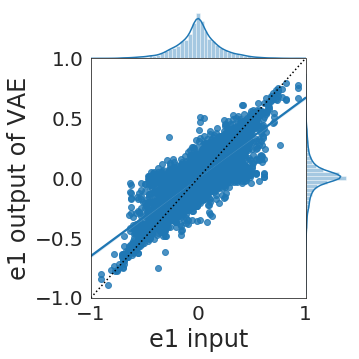

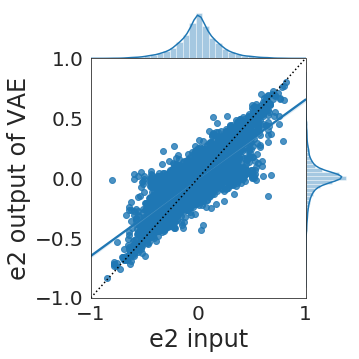

In [107]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_r_band[:,0,0], ellipticities_r_band[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_r_band[:,0,1], ellipticities_r_band[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

Text(0, 0.5, 'e of output galaxy')

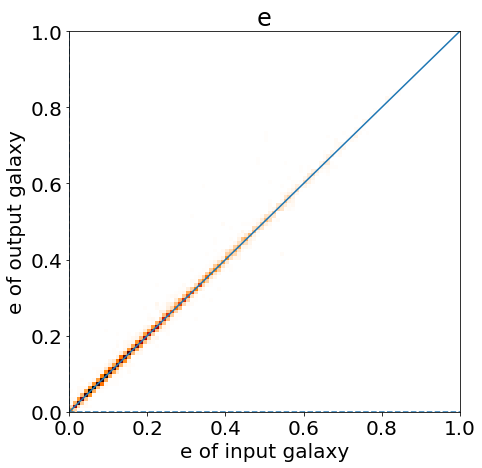

In [130]:
fig = plt.subplots(1,1, figsize=(7,7))
emax = 1
_ = plt.hist2d(e_beta[:,0,0], e_beta[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
plt.plot([0,+emax],[0,+emax])
plt.axhline(y=0, ls='--')
plt.axvline(x=0, ls='--')
plt.title('e'.format(i+1),fontsize=24)# color="w", 
#plt.xaxis.label#.set_color('w')
plt.tick_params(axis='x')#, colors='w'
plt.tick_params(axis='y')#, colors='w'
plt.xlabel('e of input galaxy')
plt.ylabel('e of output galaxy')

Text(0, 0.5, 'beta of output galaxy')

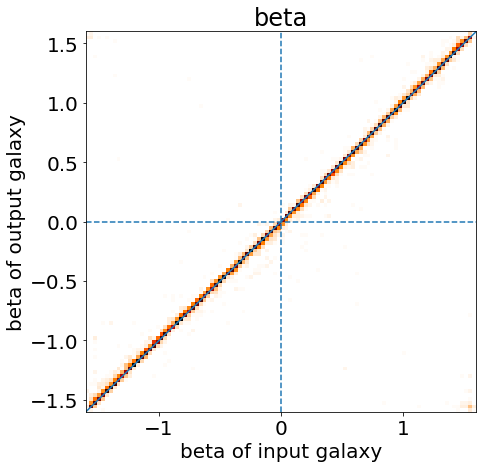

In [131]:
fig = plt.subplots(1,1, figsize=(7,7))
emax = 1.6
_ = plt.hist2d(e_beta[:,0,1], e_beta[:,1,1], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
plt.plot([-emax,+emax],[-emax,+emax])
plt.axhline(y=0, ls='--')
plt.axvline(x=0, ls='--')
plt.title('beta'.format(i+1),fontsize=24)# color="w", 
#plt.xaxis.label#.set_color('w')
plt.tick_params(axis='x')#, colors='w'
plt.tick_params(axis='y')#, colors='w'
plt.xlabel('beta of input galaxy')
plt.ylabel('beta of output galaxy')

### Luminosity plots

Alpha from 10-4 to 10-6

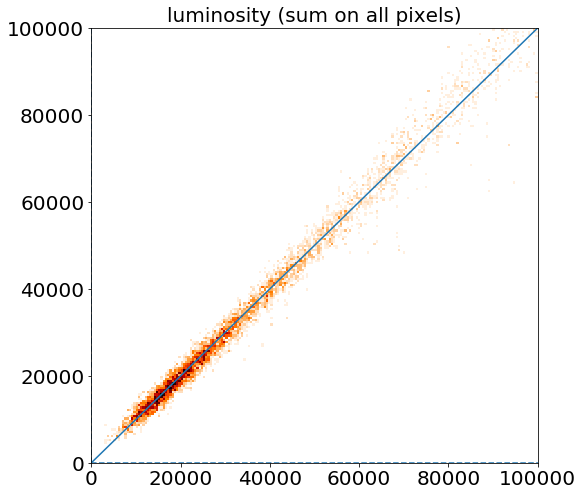

In [38]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(8,8))
emax = 100000
_ = axes.hist2d(lum_in_simple_r, lum_out_simple_r, bins=np.linspace(0,+emax,200), cmap=mpl.cm.gist_heat_r)
axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')

(0, 2000000)

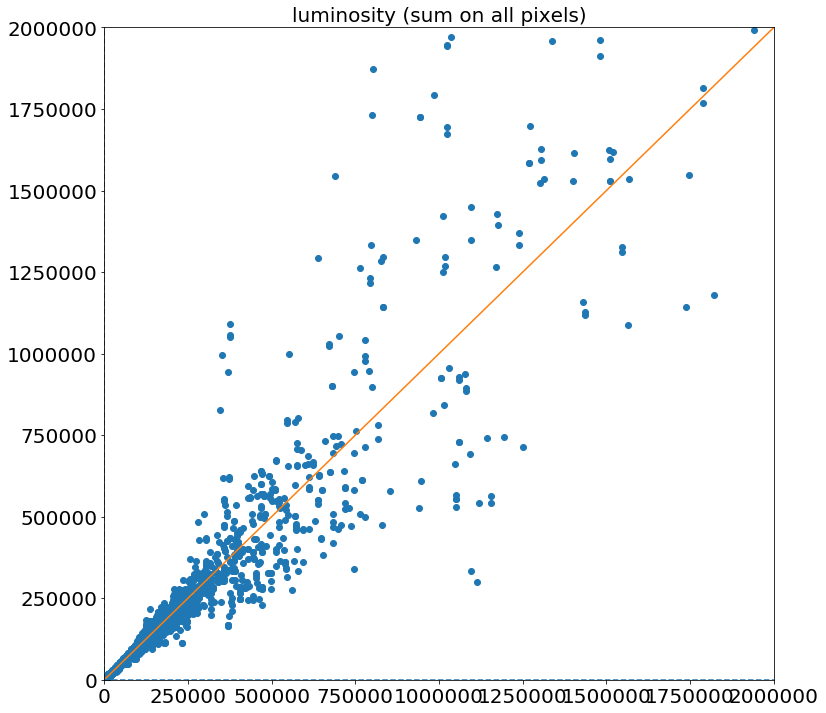

In [39]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 2000000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

(0, 200000)

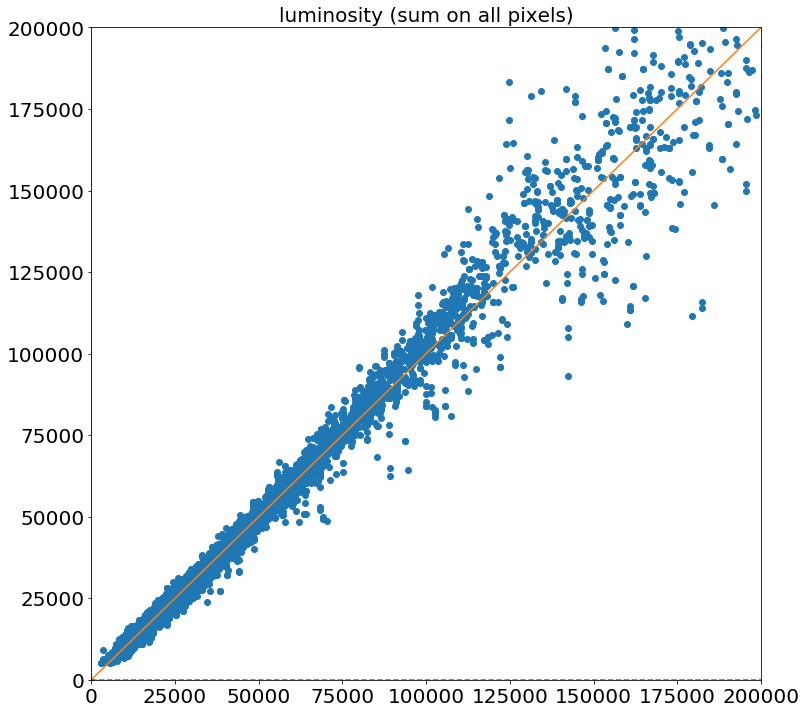

In [40]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 200000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

Alpha 10-4

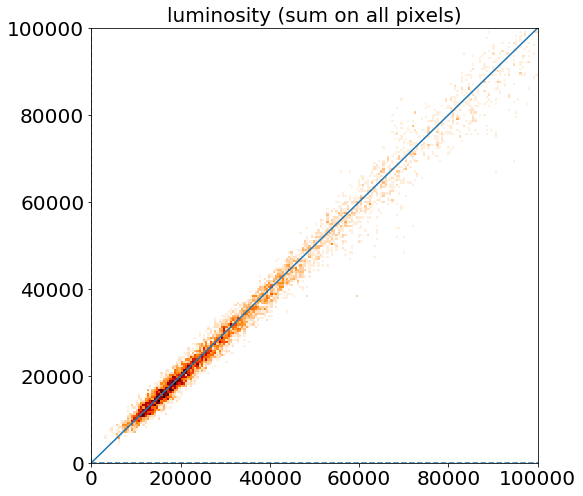

In [70]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(8,8))
emax = 100000
_ = axes.hist2d(lum_in_simple_r, lum_out_simple_r, bins=np.linspace(0,+emax,200), cmap=mpl.cm.gist_heat_r)
axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')

(0, 2000000)

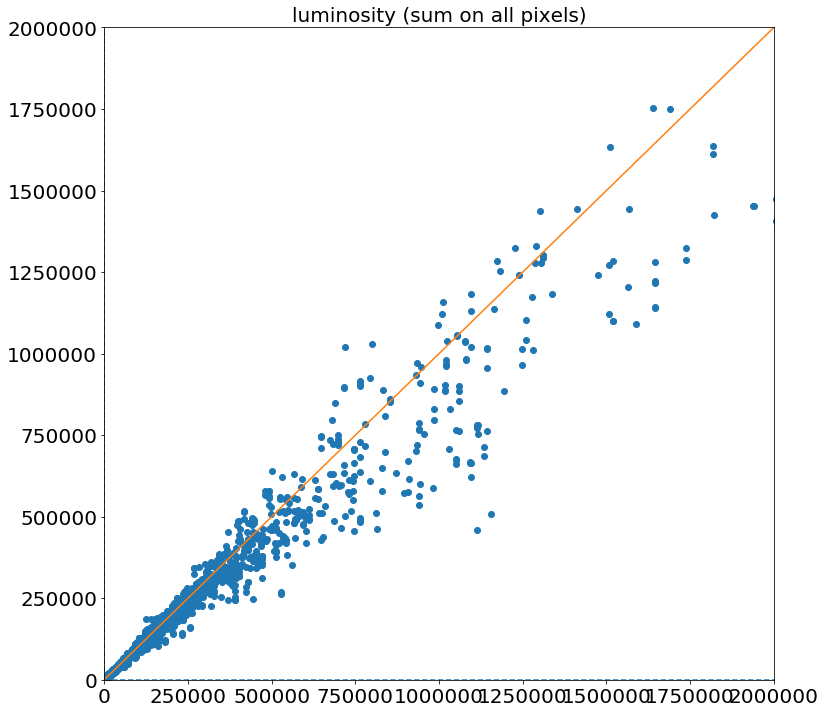

In [71]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 2000000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

(0, 200000)

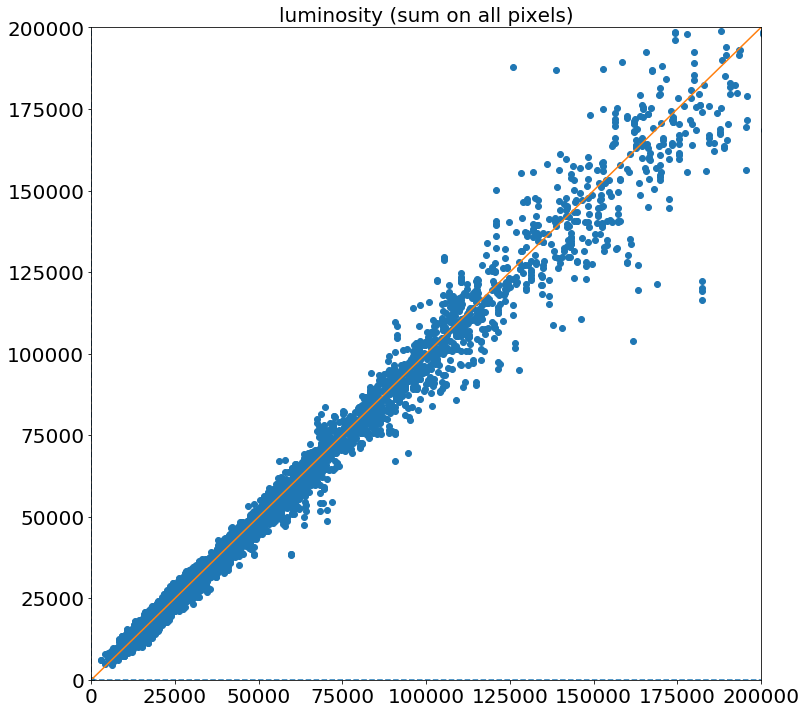

In [72]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 200000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

Alpha 10-2

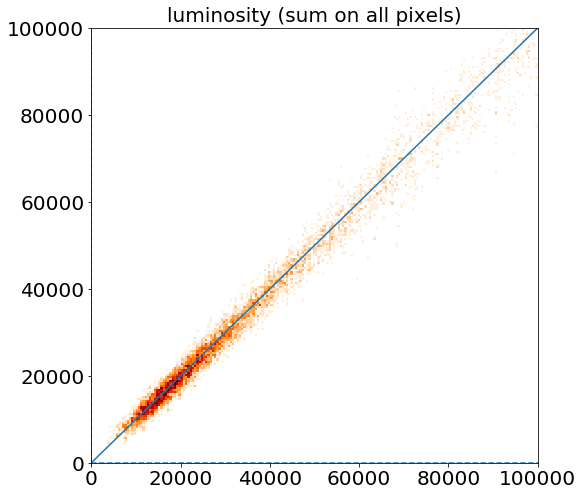

In [95]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(8,8))
emax = 100000
_ = axes.hist2d(lum_in_simple_r, lum_out_simple_r, bins=np.linspace(0,+emax,200), cmap=mpl.cm.gist_heat_r)
axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')

(0, 2000000)

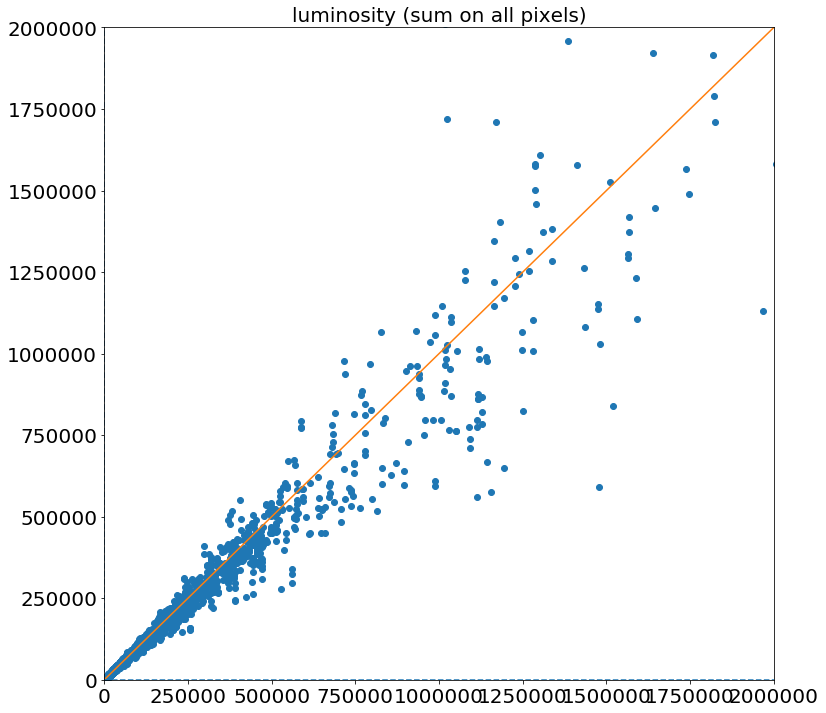

In [96]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 2000000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

(0, 200000)

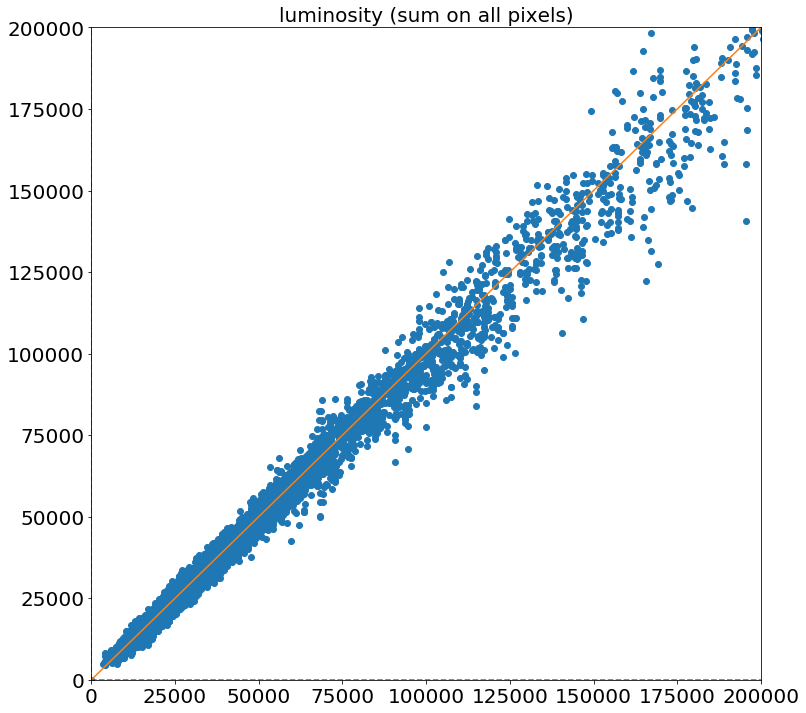

In [97]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 200000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

Alpha 10-1

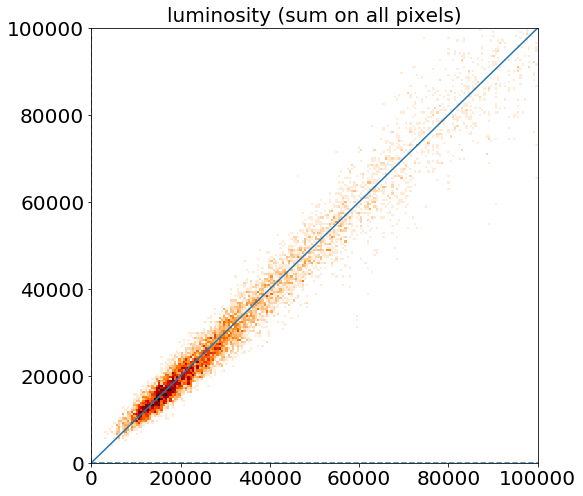

In [111]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(8,8))
emax = 100000
_ = axes.hist2d(lum_in_simple_r, lum_out_simple_r, bins=np.linspace(0,+emax,200), cmap=mpl.cm.gist_heat_r)
axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')

(0, 2000000)

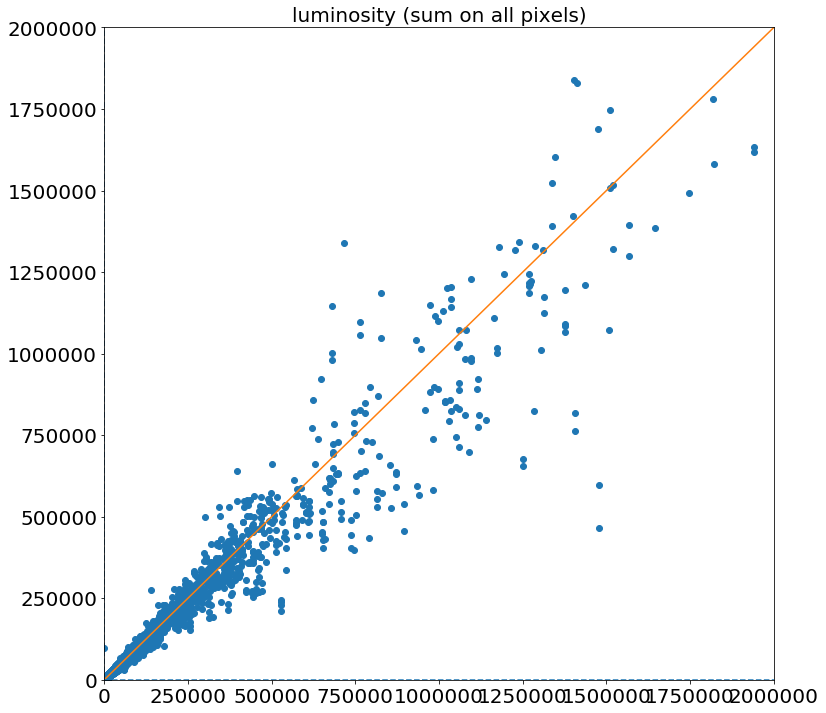

In [112]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 2000000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

(0, 200000)

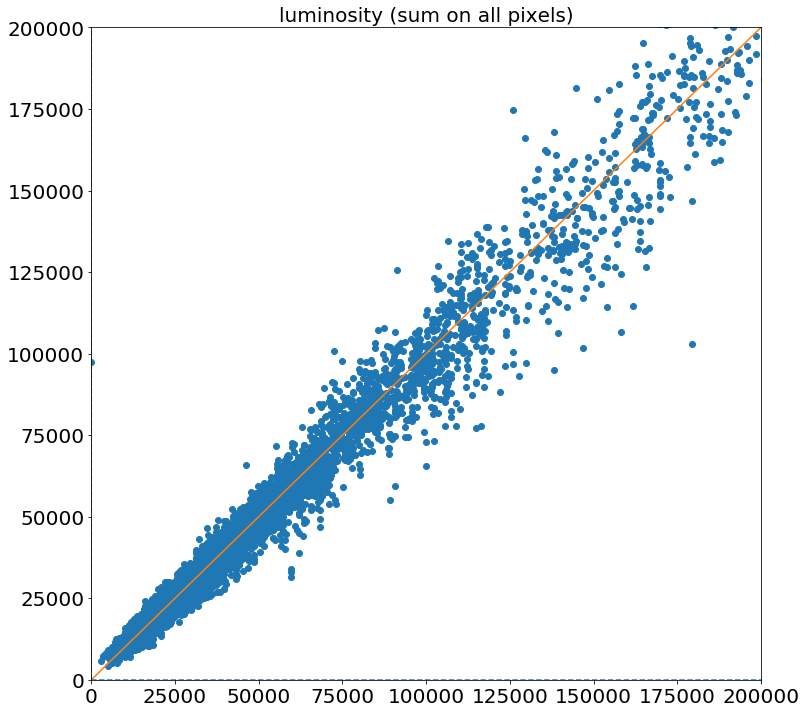

In [113]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(12,12))
emax = 200000
axes.plot(lum_in_simple_r, lum_out_simple_r,'o')

axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')
axes.set_xlim(0,emax)
axes.set_ylim(0,emax)

### Delta_e1 / Delta_e2

In [143]:
delta_e1 = ellipticities_r_band[:,0,0]-ellipticities_r_band[:,1,0]
delta_e2 = ellipticities_r_band[:,0,1]-ellipticities_r_band[:,1,1]

(-0.4, 0.4)

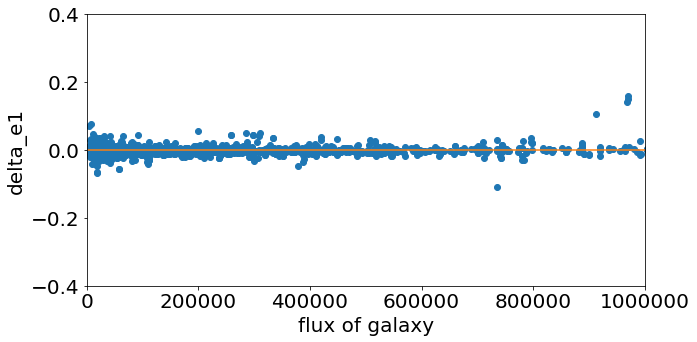

In [144]:
fig = plt.subplots(1,1, figsize=(10,5))
plt.plot(lum_in_simple[:len(delta_e1)], delta_e1, 'o')
plt.xlim(0,1000000)
plt.xlabel('flux of galaxy')
plt.ylabel('delta_e1')
plt.plot([0,1000000],[0,0])
plt.ylim(-0.4,0.4)

(-0.4, 0.4)

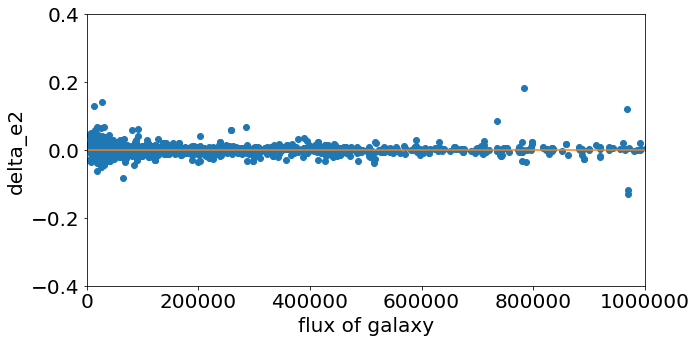

In [145]:
fig = plt.subplots(1,1, figsize=(10,5))
plt.plot(lum_in_simple[:len(delta_e2)], delta_e2, 'o')
plt.xlim(0,1000000)
plt.xlabel('flux of galaxy')
plt.ylabel('delta_e2')
plt.plot([0,1000000],[0,0])
plt.ylim(-0.4,0.4)

### Corner plot latent space

In [191]:
batch_size = 100

In [192]:
a = batch_gen_new.__getitem__(2)
output_enc = encoder_R.predict(a[0], batch_size = batch_size)

In [193]:
latent_dim =32
epsilon_std = 1.0

In [194]:
def sampling(args):
    z_mean, z_log_var = args
    epsilon = np.random.normal( 0.,
                              epsilon_std,(batch_size, latent_dim))
    return z_mean + np.exp(z_log_var / 2) * epsilon

In [195]:
z = []
for i in range (100):
    a = batch_gen_new.__getitem__(2)
    output_enc = encoder_R.predict(a[0], batch_size = batch_size)
    z.append(sampling(output_enc))


In [196]:
z = np.concatenate(z, axis = 0)

In [197]:
len(z)

10000

/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


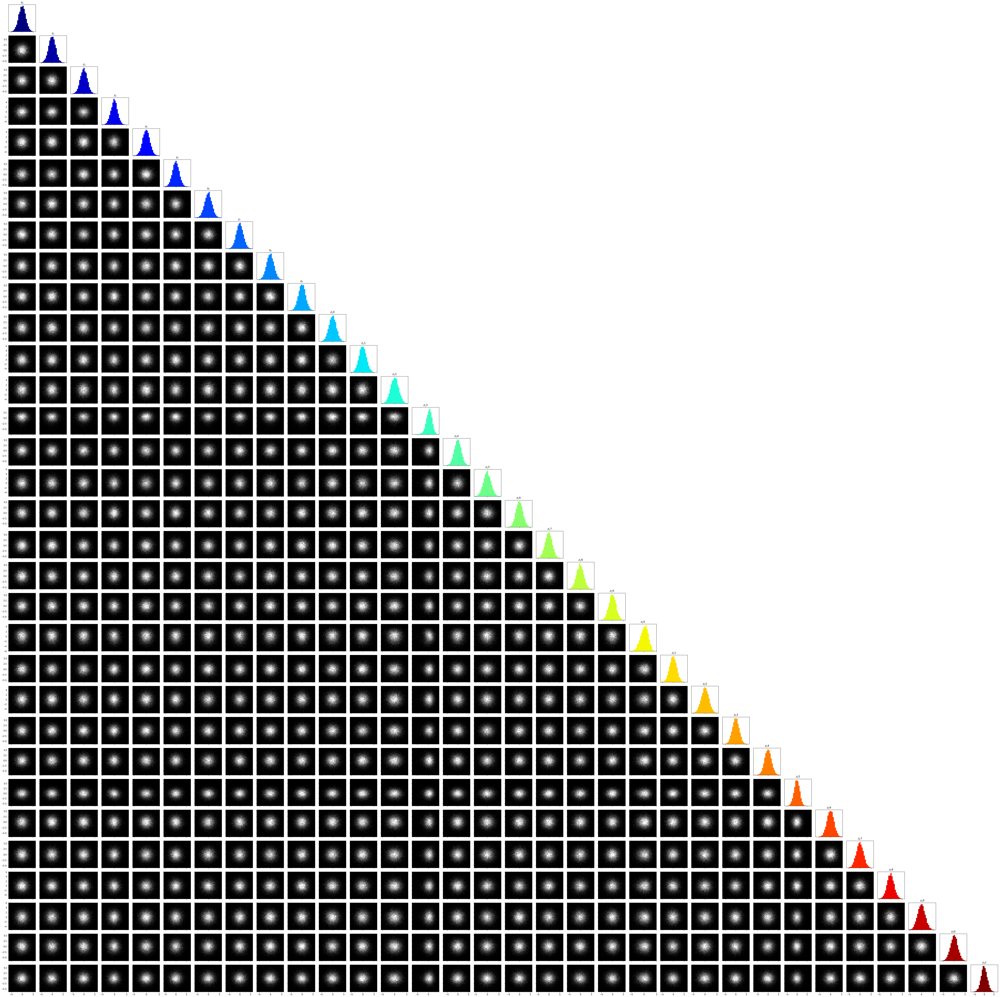

In [198]:
plot_corner_latent(z)

## LSST all filters

In [26]:
ellipticities_LSST, e_beta_LSST, lum_in_simple_lsst, lum_out_simple_lsst, scale_radius, SNR_lsst = VAE_processing(vae_lsst_conv, batch_gen_lsst,bands_lsst,2,stamp_size, N, batch_size)

### Shape plots

Alpha 10-2

Text(0, 0.5, 'e of output galaxy')

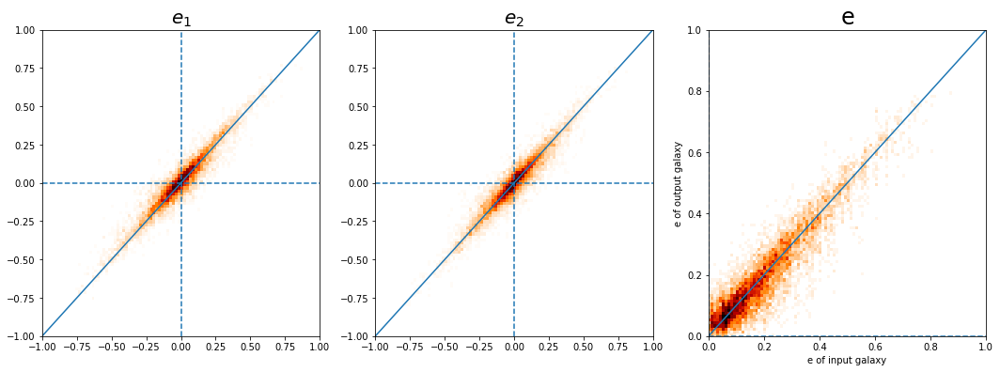

In [39]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_LSST[:,0,i], ellipticities_LSST[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1), fontsize=20)
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')
    axes[i].tick_params(axis='y')
    
_ = axes[2].hist2d(e_beta_LSST[:,0,0], e_beta_LSST[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
#plt.xaxis.label#.set_color('w')
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')

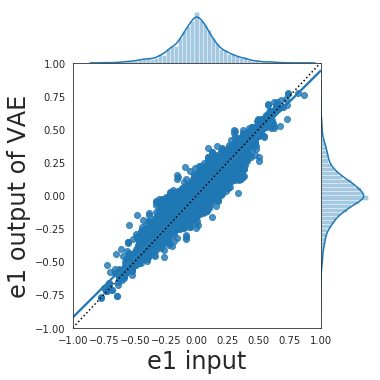

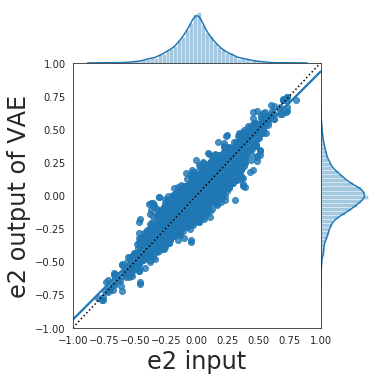

In [28]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_LSST[:,0,0], ellipticities_LSST[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_LSST[:,0,1], ellipticities_LSST[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

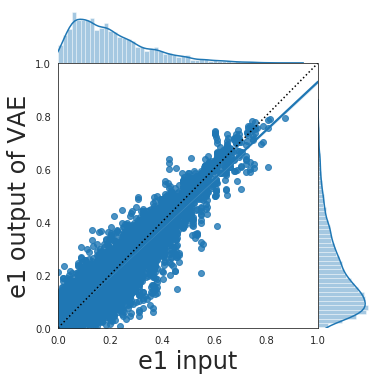

In [32]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta_LSST[:,0,0], e_beta_LSST[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


Text(0, 0.5, 'beta of output galaxy')

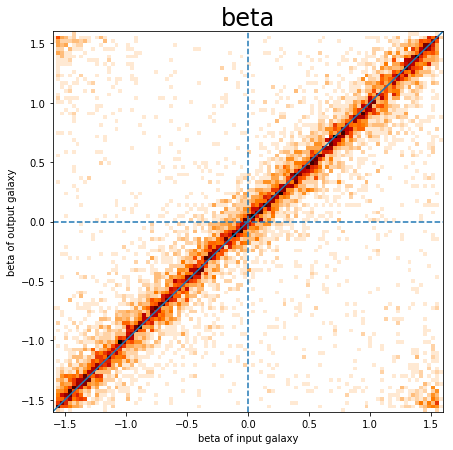

In [33]:
fig = plt.subplots(1,1, figsize=(7,7))
emax = 1.6
_ = plt.hist2d(e_beta_LSST[:,0,1], e_beta_LSST[:,1,1], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
plt.plot([-emax,+emax],[-emax,+emax])
plt.axhline(y=0, ls='--')
plt.axvline(x=0, ls='--')
plt.title('beta'.format(i+1),fontsize=24)# color="w", 
#plt.xaxis.label#.set_color('w')
plt.tick_params(axis='x')#, colors='w'
plt.tick_params(axis='y')#, colors='w'
plt.xlabel('beta of input galaxy')
plt.ylabel('beta of output galaxy')

### Luminosity plot

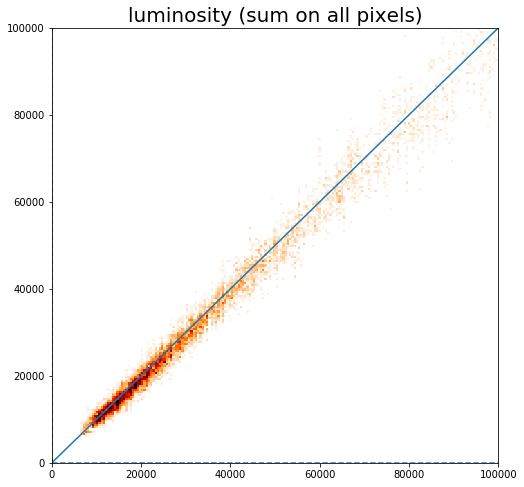

In [34]:
import matplotlib as mpl

fig, axes= plt.subplots(1,1, figsize=(8,8))
emax = 100000
_ = axes.hist2d(lum_in_simple_lsst, lum_out_simple_lsst, bins=np.linspace(0,+emax,200), cmap=mpl.cm.gist_heat_r)
axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')

(0, 200000)

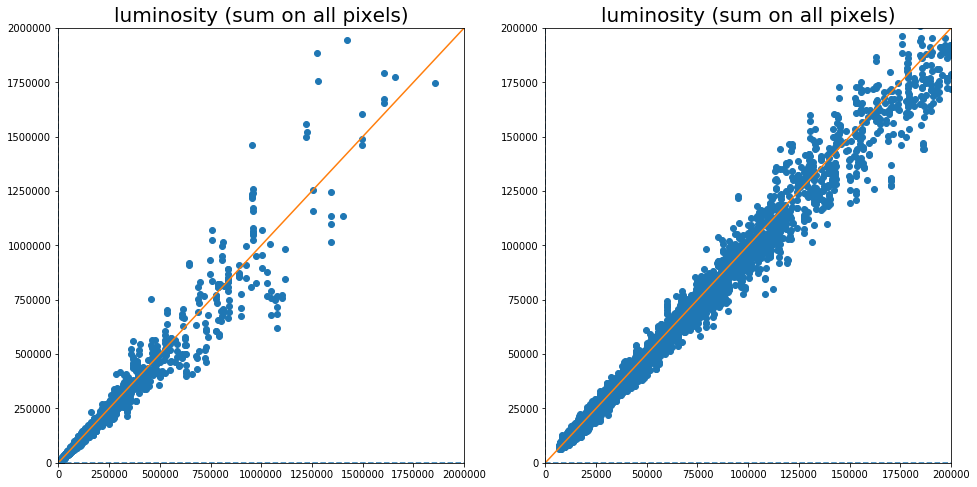

In [36]:
import matplotlib as mpl

fig, axes = plt.subplots(1,2, figsize=(16,8))
emax = 2000000
axes[0].plot(lum_in_simple_lsst, lum_out_simple_lsst,'o')

axes[0].plot([-emax,+emax],[-emax,+emax])
axes[0].axhline(y=0, ls='--')
axes[0].axvline(x=0, ls='--')
axes[0].set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes[0].spines['bottom']#.set_color('w')
axes[0].spines['right']#.set_color('w')
axes[0].spines['left']#.set_color('w')
axes[0].spines['top']#.set_color('w')
axes[0].xaxis.label#.set_color('w')
axes[0].tick_params(axis='x')#, colors='w')
axes[0].tick_params(axis='y')#, colors='w')
axes[0].set_xlim(0,emax)
axes[0].set_ylim(0,emax)

emax = 200000
axes[1].plot(lum_in_simple_lsst, lum_out_simple_lsst,'o')

axes[1].plot([-emax,+emax],[-emax,+emax])
axes[1].axhline(y=0, ls='--')
axes[1].axvline(x=0, ls='--')
axes[1].set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes[1].spines['bottom']#.set_color('w')
axes[1].spines['right']#.set_color('w')
axes[1].spines['left']#.set_color('w')
axes[1].spines['top']#.set_color('w')
axes[1].xaxis.label#.set_color('w')
axes[1].tick_params(axis='x')#, colors='w')
axes[1].tick_params(axis='y')#, colors='w')
axes[1].set_xlim(0,emax)
axes[1].set_ylim(0,emax)

### Corner plot latent space

In [42]:
batch_size = 100
a = batch_gen_lsst.__getitem__(2)
output_enc = encoder_LSST.predict(a[0], batch_size = batch_size)
latent_dim =32
epsilon_std = 1.0

def sampling(args):
    z_mean, z_log_var = args
    epsilon = np.random.normal( 0.,
                              epsilon_std,(batch_size, latent_dim))
    return z_mean + np.exp(z_log_var / 2) * epsilon

z = []

In [43]:
for i in range (100):
    a = batch_gen_lsst.__getitem__(2)
    output_enc = encoder_LSST.predict(a[0], batch_size = batch_size)
    z.append(sampling(output_enc))


z = np.concatenate(z, axis = 0)

/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


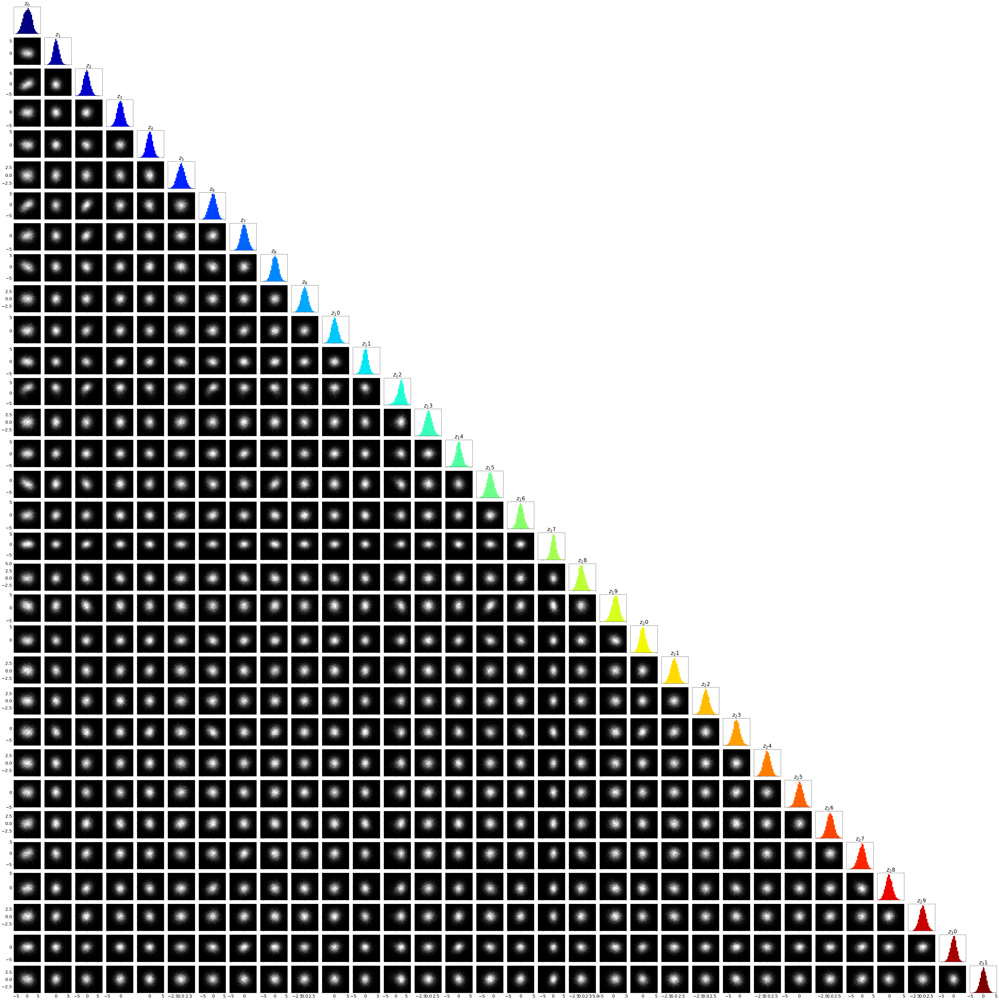

In [44]:
plot_corner_latent(z)

## LSST + Euclid all filters

Test VAE_processing for LSST and Euclid all band-pass filters

In [29]:
N = 100
batch_size = 100

ellipticities_LSST_euclid, e_beta_LSST_euclid, lum_in_simple_lsst_euclid, lum_out_simple_lsst_euclid, scale_radius, SNR_lsst_euclid = VAE_processing(vae_lsst_euclid_conv, batch_gen_lsst_euclid,bands_lsst_euclid,6,stamp_size, N, batch_size)

### Shape plots

Alpha 10-2

Text(0, 0.5, 'e of output galaxy')

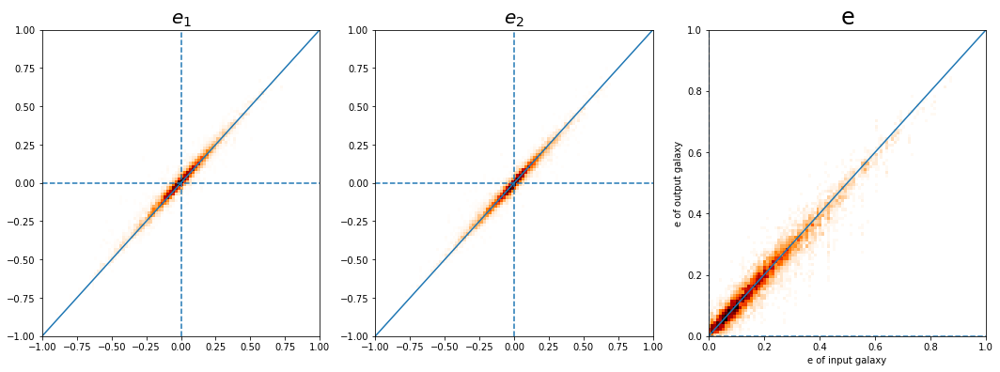

In [20]:
import matplotlib as mpl

fig, axes = plt.subplots(1,3, figsize=(18,6))
emax = 1
for i in range(2):
    _ = axes[i].hist2d(ellipticities_LSST_euclid[:,0,i], ellipticities_LSST_euclid[:,1,i], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
    axes[i].plot([-emax,+emax],[-emax,+emax])
    axes[i].axhline(y=0, ls='--')
    axes[i].axvline(x=0, ls='--')
    axes[i].set_title('$e_{}$'.format(i+1), fontsize=20)#, color="w"
    axes[i].spines['bottom']#.set_color('w')
    axes[i].spines['right']#.set_color('w')
    axes[i].spines['left']#.set_color('w')
    axes[i].spines['top']#.set_color('w')
    axes[i].xaxis.label#.set_color('w')
    axes[i].tick_params(axis='x')#, colors='w')
    axes[i].tick_params(axis='y')#, colors='w')
    

_ = axes[2].hist2d(e_beta_LSST_euclid[:,0,0], e_beta_LSST_euclid[:,1,0], bins=np.linspace(0,+emax,101), cmap=mpl.cm.gist_heat_r)
axes[2].plot([0,+emax],[0,+emax])
axes[2].axhline(y=0, ls='--')
axes[2].axvline(x=0, ls='--')
axes[2].set_title('e'.format(i+1),fontsize=24)# color="w", 
axes[2].tick_params(axis='x')#, colors='w'
axes[2].tick_params(axis='y')#, colors='w'
axes[2].set_xlabel('e of input galaxy')
axes[2].set_ylabel('e of output galaxy')

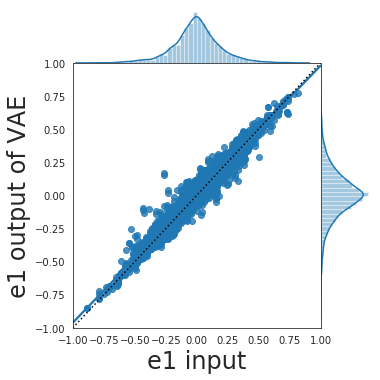

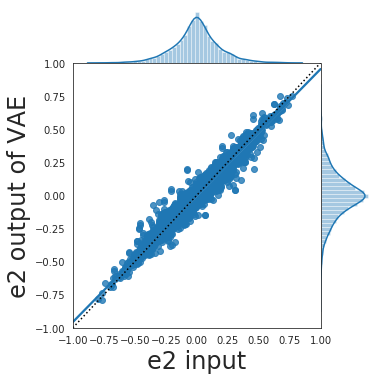

In [21]:
with sns.axes_style('white'):
            g = sns.jointplot(ellipticities_LSST_euclid[:,0,0], ellipticities_LSST_euclid[:,1,0], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

            g = sns.jointplot(ellipticities_LSST_euclid[:,0,1], ellipticities_LSST_euclid[:,1,1], kind='reg',height =5,
                              xlim =[-1, 1], ylim=[-1, 1], space=0).set_axis_labels('e2 input', 'e2 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(-1, 1),
                            np.linspace(-1, 1), ':k')

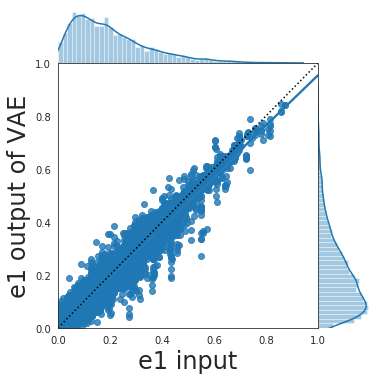

In [22]:
with sns.axes_style('white'):
            g = sns.jointplot(e_beta_LSST_euclid[:,0,0], e_beta_LSST_euclid[:,1,0], kind='reg',height =5,
                              xlim =[0, 1], ylim=[0, 1], space=0).set_axis_labels('e1 input', 'e1 output of VAE', fontsize=24)
            g.ax_joint.plot(np.linspace(0, 1),
                            np.linspace(0, 1), ':k')


In [23]:
delta_e = e_beta_LSST_euclid[:,0,0]- e_beta_LSST_euclid[:,1,0]
delta_e_rel = delta_e[:]/e_beta_LSST_euclid[:,0,0]

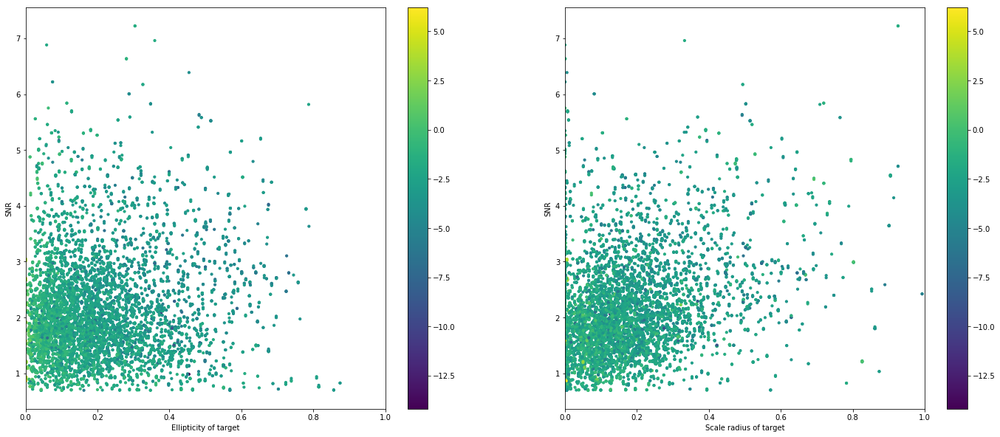

In [24]:
import matplotlib as mpl
fig, axes = plt.subplots(1,2, figsize=(24,10))

im = axes[0].scatter(e_beta_LSST_euclid[:,0,0], np.log(SNR_lsst_euclid),  c = np.log(np.abs(delta_e_rel)), s=10)#, cmap=mpl.cm.gist_heat_r)#c = delta_e1,
axes[0].set_xlabel("Ellipticity of target")
axes[0].set_ylabel("SNR")#delta r to closest (arcsecond)/scale radius of centered
#axes[0].colorbar()
#plt.xscale('log')
axes[0].set_xlim(0,1)
fig.colorbar(im, ax=axes[0])

im = axes[1].scatter(scale_radius, np.log(SNR_lsst_euclid),  c = np.log(np.abs(delta_e_rel)), s=10)#, cmap=mpl.cm.gist_heat_r)#c = delta_e1,
axes[1].set_xlabel("Scale radius of target")
axes[1].set_ylabel("SNR")#delta r to closest (arcsecond)/scale radius of centered
#axes[1].colorbar()
#plt.xscale('log')
axes[1].set_xlim(0,1)
fig.colorbar(im, ax=axes[1])

In [54]:
print(np.mean(delta_e_rel),np.mean(np.abs(delta_e_rel)))
print( np.shape(delta_e_rel))


-0.6647870543365979 0.7996704978184995
(10000,)


(-2, 1)

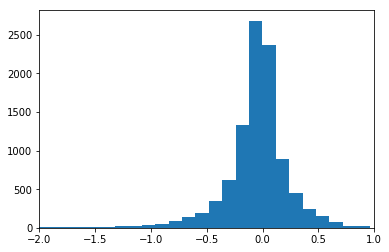

In [55]:
_ = plt.hist(delta_e_rel, bins = 10000)
plt.xlim(-2,1)

../../scripts/tools_for_VAE/tools_for_VAE/plot.py:56: RuntimeWarning: invalid value encountered in true_divide
  mean_y = ny/n
../../scripts/tools_for_VAE/tools_for_VAE/plot.py:58: RuntimeWarning: invalid value encountered in true_divide
  var_y = (ny2/n - mean_y**2)/n


(-6, 0.5)

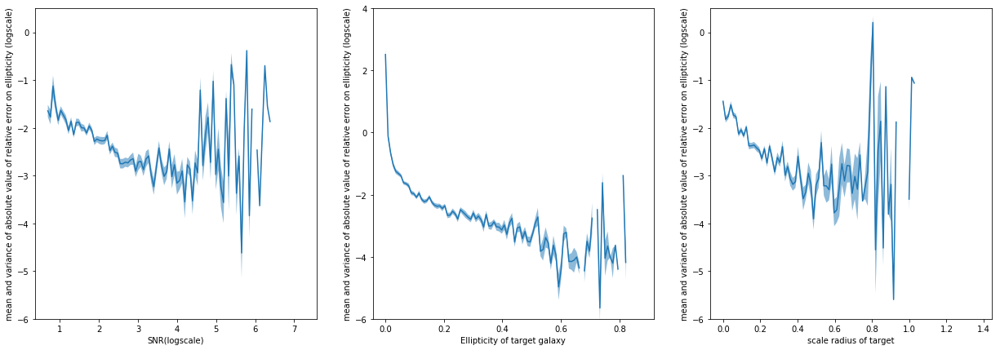

In [56]:
mean_delta, var_delta = mean_var(e_beta_LSST_euclid[:,0,0],np.log(np.abs(delta_e_rel)), bins = 100)

x = np.linspace(np.min(e_beta_LSST_euclid[:,0,0]), np.max(e_beta_LSST_euclid[:,0,0]), 100)
mid = (x[0:]+x[:])*0.5


mean_SNR, var_SNR = mean_var(np.log(SNR_lsst_euclid),np.log(np.abs(delta_e_rel)), bins = 100)

x_snr = np.linspace(np.min(np.log(SNR_lsst_euclid)), np.max(np.log(SNR_lsst_euclid)), 100)
mid_snr = (x_snr[0:]+x_snr[:])*0.5

mean_radius, var_radius = mean_var(scale_radius,np.log(np.abs(delta_e_rel)), bins = 100)

x_radius = np.linspace(np.min(scale_radius), np.max(scale_radius), 100)
mid_radius = (x_radius[0:]+x_radius[:])*0.5


fig, axes = plt.subplots(1,3, figsize=(21,7))

axes[0].plot(mid_snr,mean_SNR)
axes[0].fill_between(mid_snr, mean_SNR - var_SNR**0.5, mean_SNR + var_SNR**0.5, alpha=0.5)

axes[0].set_xlabel('SNR(logscale)')
axes[0].set_ylabel('mean and variance of absolute value of relative error on ellipticity (logscale)')
axes[0].set_ylim(-6,0.5)


axes[1].plot(mid,mean_delta)
axes[1].fill_between(mid, mean_delta - var_delta**0.5, mean_delta + var_delta**0.5, alpha=0.5)

axes[1].set_xlabel('Ellipticity of target galaxy')
axes[1].set_ylabel('mean and variance of absolute value of relative error on ellipticity (logscale)')
axes[1].set_ylim(-6,4)


axes[2].plot(mid_radius,mean_radius)
axes[2].fill_between(mid_radius, mean_radius - var_radius**0.5, mean_radius + var_radius**0.5, alpha=0.5)

axes[2].set_xlabel('scale radius of target')
axes[2].set_ylabel('mean and variance of absolute value of relative error on ellipticity (logscale)')
axes[2].set_ylim(-6,0.5)

Absolute error

In [25]:
delta_e_abs = np.abs(e_beta_LSST_euclid[:,0,0]- e_beta_LSST_euclid[:,1,0])

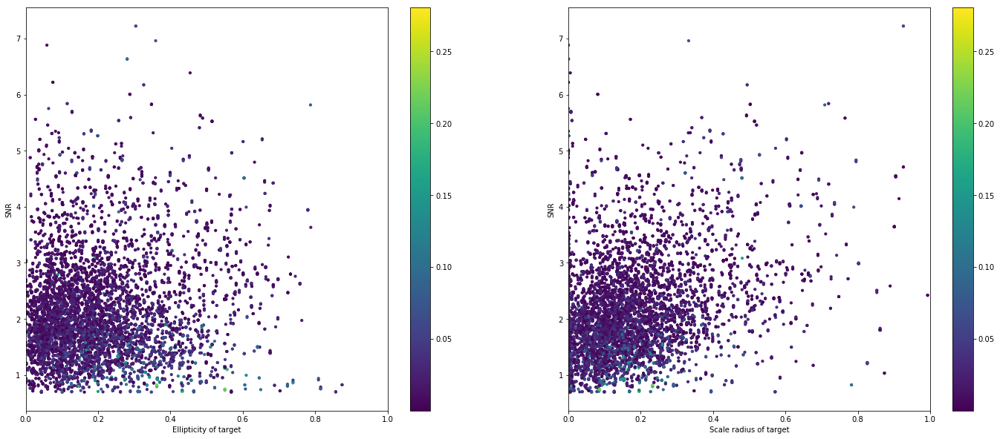

In [26]:
import matplotlib as mpl
fig, axes = plt.subplots(1,2, figsize=(24,10))

im = axes[0].scatter(e_beta_LSST_euclid[:,0,0], np.log(SNR_lsst_euclid),  c = delta_e_abs, s=10)#, cmap=mpl.cm.gist_heat_r)#c = delta_e1,
axes[0].set_xlabel("Ellipticity of target")
axes[0].set_ylabel("SNR")#delta r to closest (arcsecond)/scale radius of centered
#axes[0].colorbar()
#plt.xscale('log')
axes[0].set_xlim(0,1)
fig.colorbar(im, ax=axes[0])

im = axes[1].scatter(scale_radius, np.log(SNR_lsst_euclid),  c = delta_e_abs, s=10)#, cmap=mpl.cm.gist_heat_r)#c = delta_e1,
axes[1].set_xlabel("Scale radius of target")
axes[1].set_ylabel("SNR")#delta r to closest (arcsecond)/scale radius of centered
#axes[1].colorbar()
#plt.xscale('log')
axes[1].set_xlim(0,1)
fig.colorbar(im, ax=axes[1])

Text(0, 0.5, 'mean and variance of absolute value of error on ellipticity (logscale)')

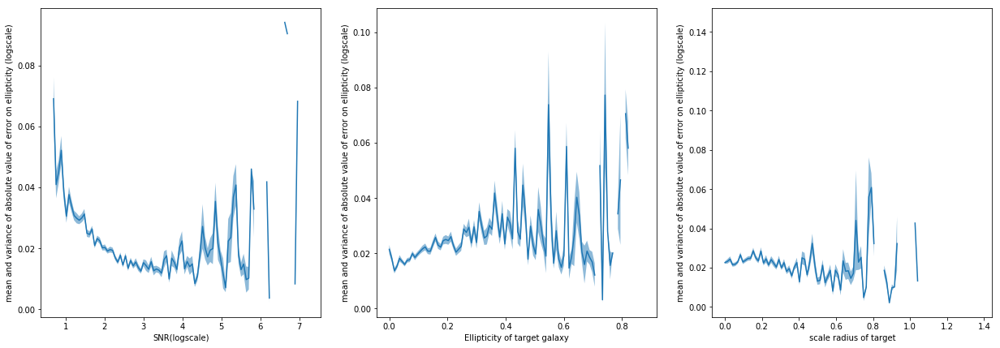

In [28]:
mean_delta, var_delta = mean_var(e_beta_LSST_euclid[:,0,0],delta_e_abs, bins = 100)

x = np.linspace(np.min(e_beta_LSST_euclid[:,0,0]), np.max(e_beta_LSST_euclid[:,0,0]), 100)
mid = (x[0:]+x[:])*0.5


mean_SNR, var_SNR = mean_var(np.log(SNR_lsst_euclid),delta_e_abs, bins = 100)

x_snr = np.linspace(np.min(np.log(SNR_lsst_euclid)), np.max(np.log(SNR_lsst_euclid)), 100)
mid_snr = (x_snr[0:]+x_snr[:])*0.5

mean_radius, var_radius = mean_var(scale_radius,delta_e_abs, bins = 100)

x_radius = np.linspace(np.min(scale_radius), np.max(scale_radius), 100)
mid_radius = (x_radius[0:]+x_radius[:])*0.5


fig, axes = plt.subplots(1,3, figsize=(21,7))

axes[0].plot(mid_snr,mean_SNR)
axes[0].fill_between(mid_snr, mean_SNR - var_SNR**0.5, mean_SNR + var_SNR**0.5, alpha=0.5)

axes[0].set_xlabel('SNR(logscale)')
axes[0].set_ylabel('mean and variance of absolute value of error on ellipticity (logscale)')
#axes[0].set_ylim(-6,0.5)


axes[1].plot(mid,mean_delta)
axes[1].fill_between(mid, mean_delta - var_delta**0.5, mean_delta + var_delta**0.5, alpha=0.5)

axes[1].set_xlabel('Ellipticity of target galaxy')
axes[1].set_ylabel('mean and variance of absolute value of error on ellipticity (logscale)')
#axes[1].set_ylim(-6,4)


axes[2].plot(mid_radius,mean_radius)
axes[2].fill_between(mid_radius, mean_radius - var_radius**0.5, mean_radius + var_radius**0.5, alpha=0.5)

axes[2].set_xlabel('scale radius of target')
axes[2].set_ylabel('mean and variance of absolute value of error on ellipticity (logscale)')
#axes[2].set_ylim(-6,0.5)

Text(0, 0.5, 'beta of output galaxy')

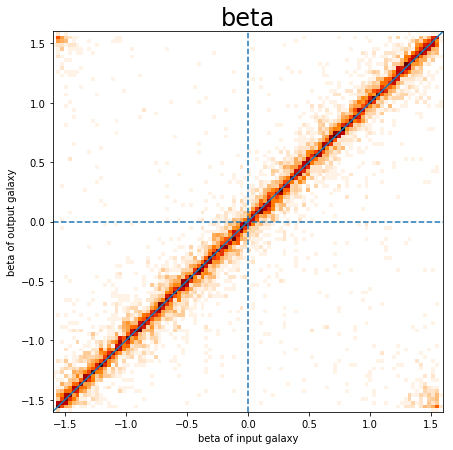

In [57]:
fig = plt.subplots(1,1, figsize=(7,7))
emax = 1.6
_ = plt.hist2d(e_beta_LSST_euclid[:,0,1], e_beta_LSST_euclid[:,1,1], bins=np.linspace(-emax,+emax,101), cmap=mpl.cm.gist_heat_r)
plt.plot([-emax,+emax],[-emax,+emax])
plt.axhline(y=0, ls='--')
plt.axvline(x=0, ls='--')
plt.title('beta'.format(i+1),fontsize=24)# color="w", 
#plt.xaxis.label#.set_color('w')
plt.tick_params(axis='x')#, colors='w'
plt.tick_params(axis='y')#, colors='w'
plt.xlabel('beta of input galaxy')
plt.ylabel('beta of output galaxy')

### Luminosity plots

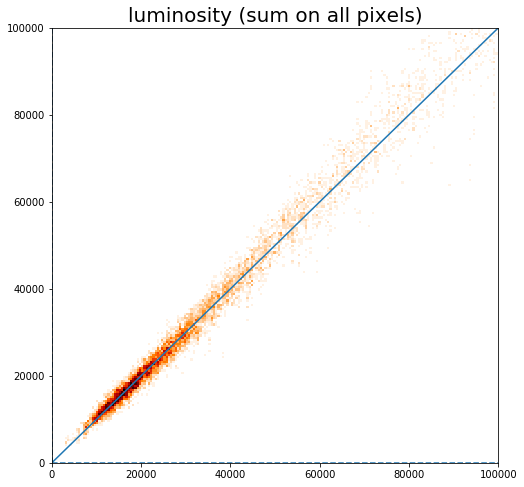

In [41]:
import matplotlib as mpl

fig, axes = plt.subplots(1,1, figsize=(8,8))
emax = 100000
_ = axes.hist2d(lum_in_simple_lsst_euclid, lum_out_simple_lsst_euclid, bins=np.linspace(0,+emax,200), cmap=mpl.cm.gist_heat_r)
axes.plot([-emax,+emax],[-emax,+emax])
axes.axhline(y=0, ls='--')
axes.axvline(x=0, ls='--')
axes.set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes.spines['bottom']#.set_color('w')
axes.spines['right']#.set_color('w')
axes.spines['left']#.set_color('w')
axes.spines['top']#.set_color('w')
axes.xaxis.label#.set_color('w')
axes.tick_params(axis='x')#, colors='w')
axes.tick_params(axis='y')#, colors='w')

(0, 200000)

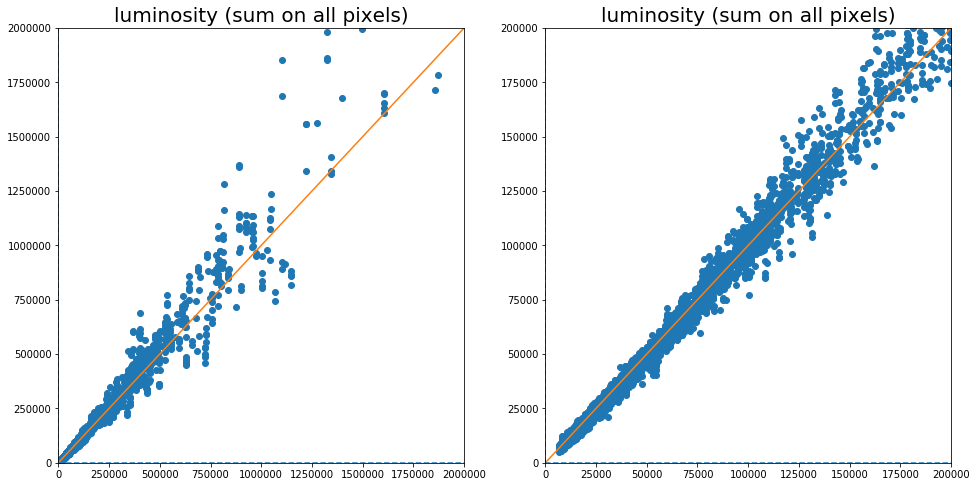

In [45]:
import matplotlib as mpl

fig, axes = plt.subplots(1,2, figsize=(16,8))
emax = 2000000
axes[0].plot(lum_in_simple_lsst_euclid, lum_out_simple_lsst_euclid,'o')

axes[0].plot([-emax,+emax],[-emax,+emax])
axes[0].axhline(y=0, ls='--')
axes[0].axvline(x=0, ls='--')
axes[0].set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes[0].spines['bottom']#.set_color('w')
axes[0].spines['right']#.set_color('w')
axes[0].spines['left']#.set_color('w')
axes[0].spines['top']#.set_color('w')
axes[0].xaxis.label#.set_color('w')
axes[0].tick_params(axis='x')#, colors='w')
axes[0].tick_params(axis='y')#, colors='w')
axes[0].set_xlim(0,emax)
axes[0].set_ylim(0,emax)

emax = 200000
axes[1].plot(lum_in_simple_lsst_euclid, lum_out_simple_lsst_euclid,'o')

axes[1].plot([-emax,+emax],[-emax,+emax])
axes[1].axhline(y=0, ls='--')
axes[1].axvline(x=0, ls='--')
axes[1].set_title('luminosity (sum on all pixels)', fontsize=20)#, color="w"
axes[1].spines['bottom']#.set_color('w')
axes[1].spines['right']#.set_color('w')
axes[1].spines['left']#.set_color('w')
axes[1].spines['top']#.set_color('w')
axes[1].xaxis.label#.set_color('w')
axes[1].tick_params(axis='x')#, colors='w')
axes[1].tick_params(axis='y')#, colors='w')
axes[1].set_xlim(0,emax)
axes[1].set_ylim(0,emax)

### Corner plot latent space

In [55]:
latent_dim =32
epsilon_std = 1.0

a = batch_gen_lsst_euclid.__getitem__(2)
output_enc = encoder_LSST_EUCLID.predict(a[0], batch_size = batch_size)

def sampling(args):
    z_mean, z_log_var = args
    epsilon = np.random.normal( 0.,
                              epsilon_std,(batch_size, latent_dim))
    return z_mean + np.exp(z_log_var / 2) * epsilon

In [56]:
z = []
for i in range (100):
    a = batch_gen_lsst_euclid.__getitem__(2)
    output_enc = encoder_LSST_EUCLID.predict(a[0], batch_size = batch_size)
    z.append(sampling(output_enc))

z = np.concatenate(z, axis = 0)

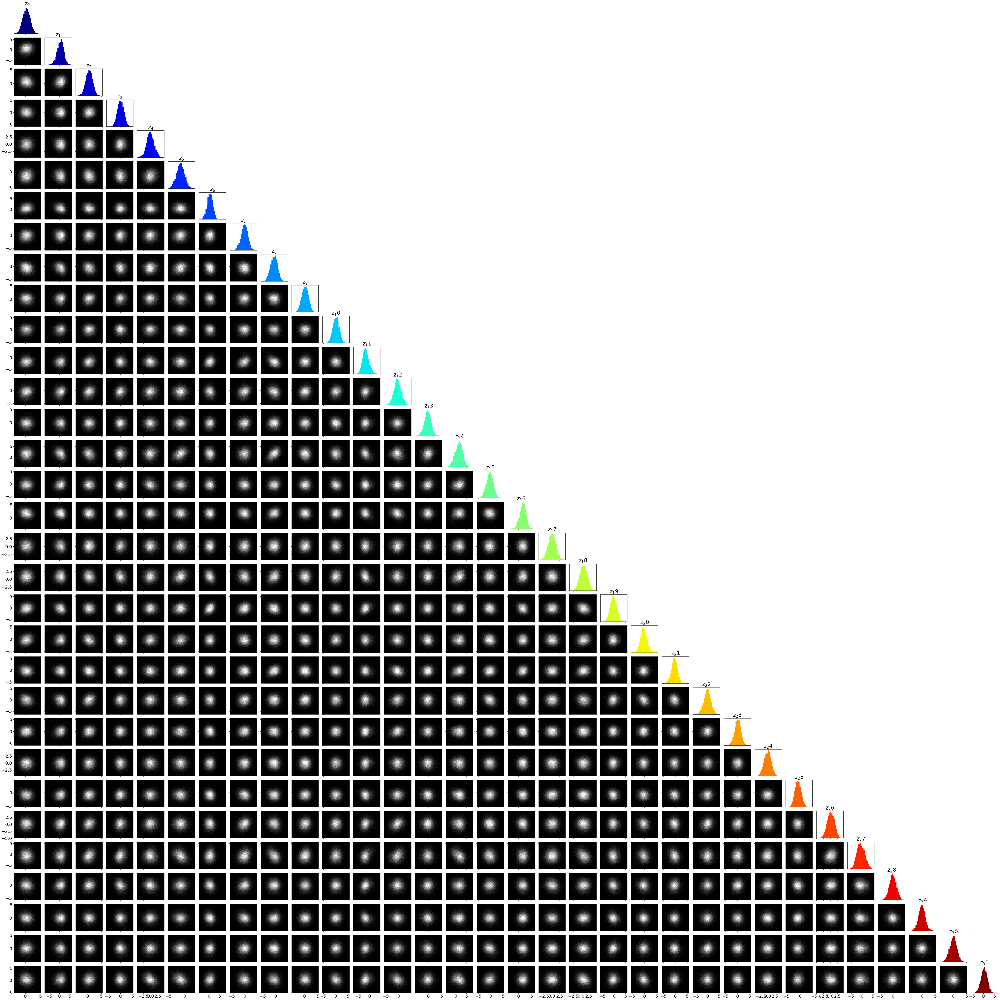

In [57]:
plot_corner_latent(z)

### N sampling of different galaxies for R band only

In [114]:
# define the number of samplings
N = 3
nb_of_samplings = 10

batch_size = 100

In [115]:
# Define the PSF used for measurement
PSF = galsim.Moffat(fwhm=0.1, beta=2.5)
final_epsf_image = PSF.drawImage(scale=0.2)

(100, 64, 64, 1)
0
0
1
2
3
4
5
6
7
8
9
(100, 64, 64, 1)
1
0
1
2
3
4
5
6
7
8
9
(100, 64, 64, 1)
2
0
1
2
3
4
5
6
7
8
9
0


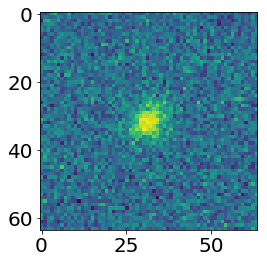

In [116]:
res_out_lsst_e1 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e2 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e = np.empty([N,nb_of_samplings*batch_size], dtype='float32')

gal = []
input_noiseless = []
err_count = 0

for i in range (N):
    list_galsim_simple=batch_gen_new.__getitem__(2)
    gal.append(list_galsim_simple[0][0])
    print(list_galsim_simple[1].shape)
    input_noiseless.append(denorm(list_galsim_simple[1], bands_r, channel_last = True))
    
    plt.imshow(list_galsim_simple[0][0][:,:,0])#
    for k in range (len(list_galsim_simple[0])):
        list_galsim_simple[0][k] = gal[i]
    #try: 
    print(i)
    for j in range (nb_of_samplings):
        print(j)
        output_vae_list_lsst = vae_lsst_r_band_conv.predict(list_galsim_simple[0], batch_size = batch_size)
        output_vae_list_lsst = denorm (output_vae_list_lsst, bands_r, channel_last = True)


        for t in range (batch_size):
            img_out_simple = galsim.Image(output_vae_list_lsst[t][:,:,0])
            res_out_lsst_e1[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e1
            res_out_lsst_e2[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e2
            res_out_lsst_e[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e   
            
    #except :
    #    err_count +=1
    #    print('erreur')
    #    pass
    #continue
            
print(err_count)

In [86]:
res_in_e1 = np.empty([N], dtype='float32')
res_in_e2 = np.empty([N], dtype='float32')
res_in_e = np.empty([N], dtype='float32')

for k in range (N):
#    try: 
    img_in_simple = galsim.Image(input_noiseless[k][0][:,:,0])
    res_in_e1[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e1
    res_in_e2[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e2
    res_in_e[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e
    print(res_in_e1[k], res_in_e2[k])

0.024936603 -0.033879574
-0.0044743544 0.09465875
-0.035076052 0.050281707


Alpha from 10-4 to 10-6

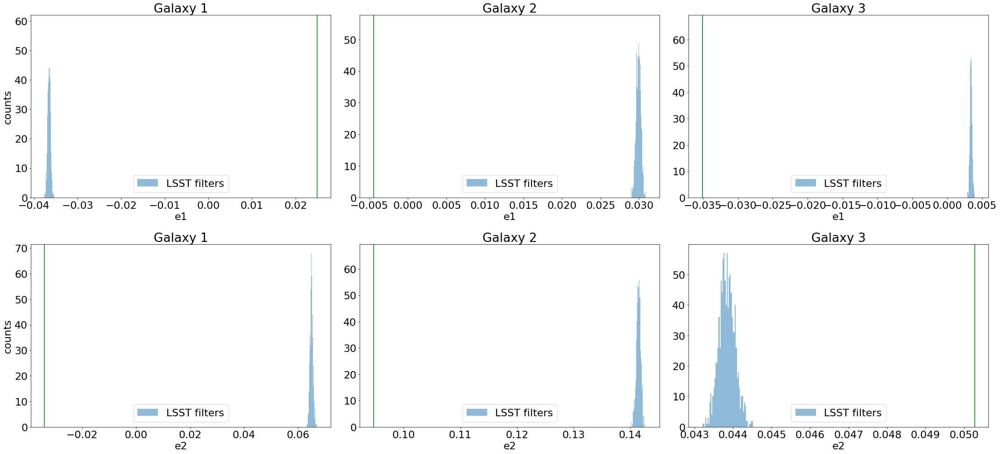

In [87]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)


fig, axes = plt.subplots(2,3, figsize=(30,14))

ax = axes[0,0]
_ = ax.hist(res_out_lsst_e1[0], bins = 50,label ='LSST filters' ,  alpha = 0.5)

ax.axvline(res_in_e1[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e1')
#ax.ticklabel_format(['y'],'sci')
ax.legend()

ax = axes[0,1]
_ = ax.hist(res_out_lsst_e1[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e1')
ax.legend()

ax = axes[0,2]
_ = ax.hist(res_out_lsst_e1[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[2],color='g')
ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e1')
ax.legend()

ax = axes[1,0]
_ = ax.hist(res_out_lsst_e2[0] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,1]
_ = ax.hist(res_out_lsst_e2[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,2]
_ = ax.hist(res_out_lsst_e2[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[2],color='g')

ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e2')
ax.legend()

plt.tight_layout()

(-0.5, 63.5, 63.5, -0.5)

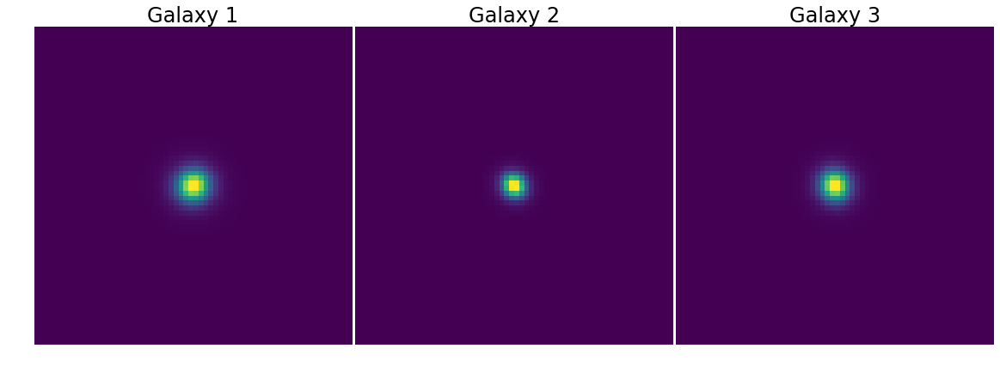

In [88]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)


N_plot = 3
fig, axes = plt.subplots(1, N_plot, figsize=(20, 7))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

ax = axes[0]
ax.imshow(input_noiseless[0][0][:,:,0])
ax.set_title('Galaxy 1')
ax.axis('off')

ax = axes[1]
ax.imshow(input_noiseless[1][0][:,:,0])
ax.set_title('Galaxy 2')
ax.axis('off')

ax = axes[2]
ax.imshow(input_noiseless[2][0][:,:,0])
ax.set_title('Galaxy 3')
ax.axis('off')

10-4

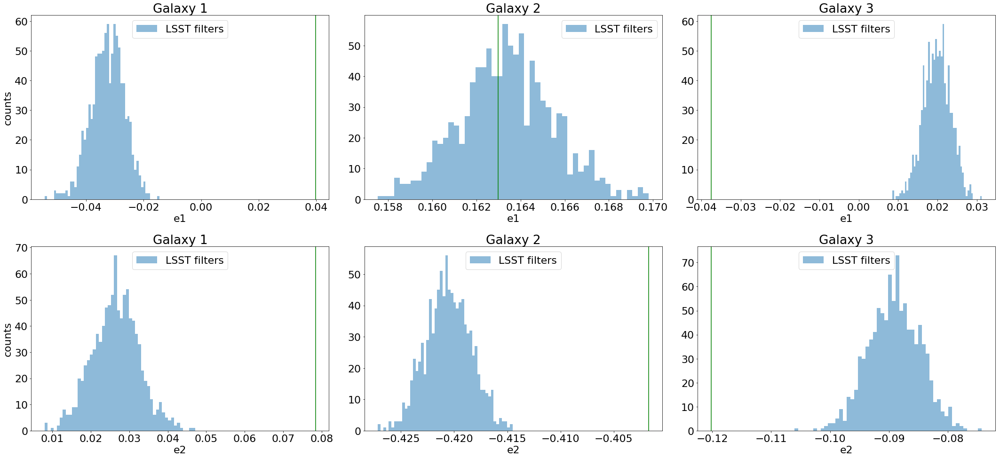

In [77]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)


fig, axes = plt.subplots(2,3, figsize=(30,14))

ax = axes[0,0]
_ = ax.hist(res_out_lsst_e1[0], bins = 50,label ='LSST filters' ,  alpha = 0.5)

ax.axvline(res_in_e1[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e1')
#ax.ticklabel_format(['y'],'sci')
ax.legend()

ax = axes[0,1]
_ = ax.hist(res_out_lsst_e1[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e1')
ax.legend()

ax = axes[0,2]
_ = ax.hist(res_out_lsst_e1[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[2],color='g')
ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e1')
ax.legend()

ax = axes[1,0]
_ = ax.hist(res_out_lsst_e2[0] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,1]
_ = ax.hist(res_out_lsst_e2[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,2]
_ = ax.hist(res_out_lsst_e2[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[2],color='g')

ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e2')
ax.legend()

plt.tight_layout()

(-0.5, 63.5, 63.5, -0.5)

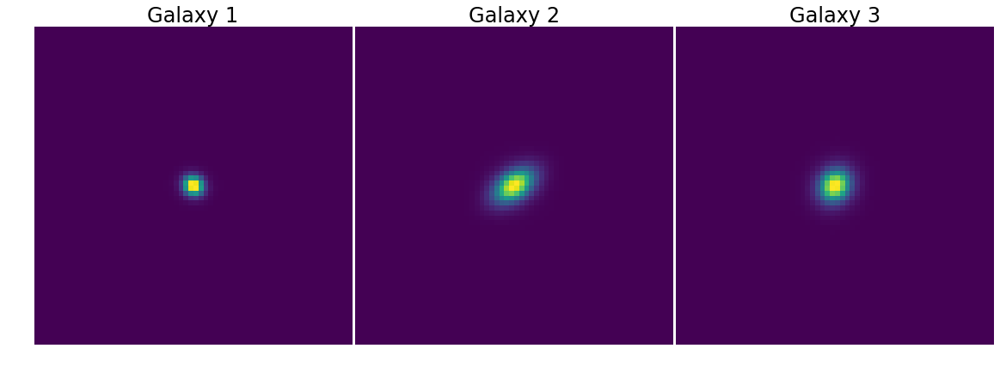

In [83]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)


N_plot = 3
fig, axes = plt.subplots(1, N_plot, figsize=(20, 7))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

ax = axes[0]
ax.imshow(input_noiseless[0][0][:,:,0])
ax.set_title('Galaxy 1')
ax.axis('off')

ax = axes[1]
ax.imshow(input_noiseless[1][0][:,:,0])
ax.set_title('Galaxy 2')
ax.axis('off')

ax = axes[2]
ax.imshow(input_noiseless[2][0][:,:,0])
ax.set_title('Galaxy 3')
ax.axis('off')

10-2

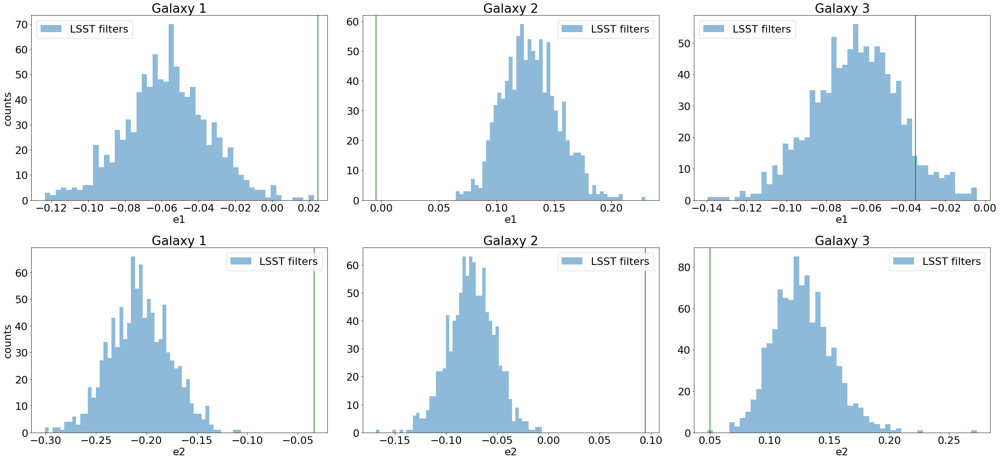

In [102]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)


fig, axes = plt.subplots(2,3, figsize=(30,14))

ax = axes[0,0]
_ = ax.hist(res_out_lsst_e1[0], bins = 50,label ='LSST filters' ,  alpha = 0.5)

ax.axvline(res_in_e1[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e1')
#ax.ticklabel_format(['y'],'sci')
ax.legend()

ax = axes[0,1]
_ = ax.hist(res_out_lsst_e1[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e1')
ax.legend()

ax = axes[0,2]
_ = ax.hist(res_out_lsst_e1[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[2],color='g')
ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e1')
ax.legend()

ax = axes[1,0]
_ = ax.hist(res_out_lsst_e2[0] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,1]
_ = ax.hist(res_out_lsst_e2[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,2]
_ = ax.hist(res_out_lsst_e2[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[2],color='g')

ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e2')
ax.legend()

plt.tight_layout()

(-0.5, 63.5, 63.5, -0.5)

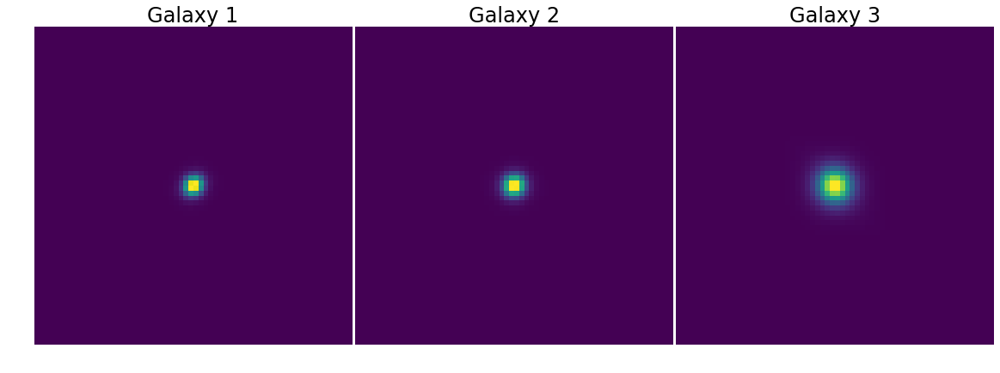

In [103]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)


N_plot = 3
fig, axes = plt.subplots(1, N_plot, figsize=(20, 7))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

ax = axes[0]
ax.imshow(input_noiseless[0][0][:,:,0])
ax.set_title('Galaxy 1')
ax.axis('off')

ax = axes[1]
ax.imshow(input_noiseless[1][0][:,:,0])
ax.set_title('Galaxy 2')
ax.axis('off')

ax = axes[2]
ax.imshow(input_noiseless[2][0][:,:,0])
ax.set_title('Galaxy 3')
ax.axis('off')

Alpha 10-1

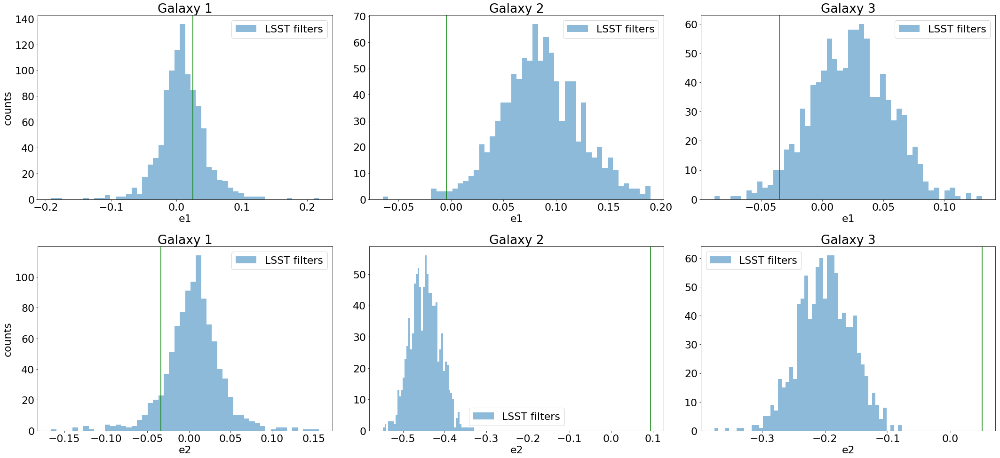

In [117]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)


fig, axes = plt.subplots(2,3, figsize=(30,14))

ax = axes[0,0]
_ = ax.hist(res_out_lsst_e1[0], bins = 50,label ='LSST filters' ,  alpha = 0.5)

ax.axvline(res_in_e1[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e1')
#ax.ticklabel_format(['y'],'sci')
ax.legend()

ax = axes[0,1]
_ = ax.hist(res_out_lsst_e1[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e1')
ax.legend()

ax = axes[0,2]
_ = ax.hist(res_out_lsst_e1[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[2],color='g')
ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e1')
ax.legend()

ax = axes[1,0]
_ = ax.hist(res_out_lsst_e2[0] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,1]
_ = ax.hist(res_out_lsst_e2[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,2]
_ = ax.hist(res_out_lsst_e2[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[2],color='g')

ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e2')
ax.legend()

plt.tight_layout()

(-0.5, 63.5, 63.5, -0.5)

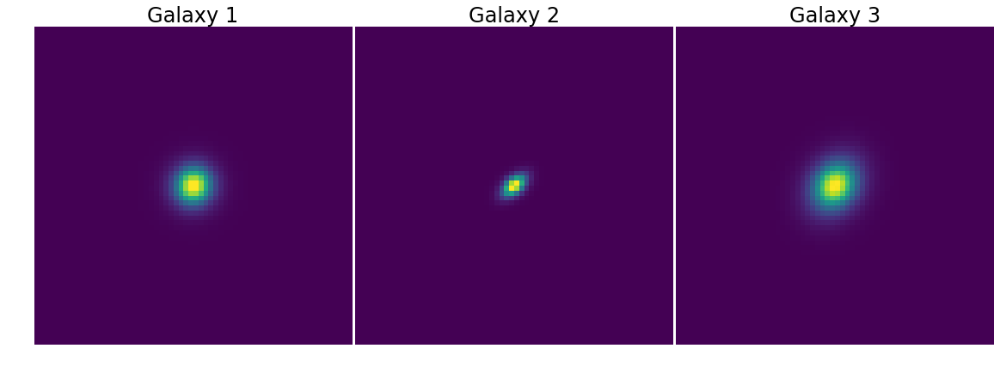

In [118]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)


N_plot = 3
fig, axes = plt.subplots(1, N_plot, figsize=(20, 7))
fig.subplots_adjust(wspace=.01, hspace=.15)

indices = np.random.choice(100, size=N_plot*N_plot, replace=False)

ax = axes[0]
ax.imshow(input_noiseless[0][0][:,:,0])
ax.set_title('Galaxy 1')
ax.axis('off')

ax = axes[1]
ax.imshow(input_noiseless[1][0][:,:,0])
ax.set_title('Galaxy 2')
ax.axis('off')

ax = axes[2]
ax.imshow(input_noiseless[2][0][:,:,0])
ax.set_title('Galaxy 3')
ax.axis('off')

### N sampling of different galaxies for LSST only

0
0
1
2
3
4
5
6
7
8
9
1
0
1
2
3
4
5
6
7
8
9
2
0
1
2
3
4
5
6
7
8
9
0


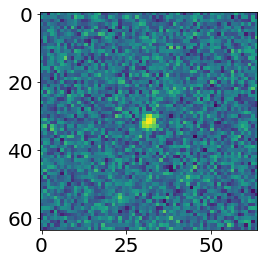

In [263]:
res_out_lsst_e1 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e2 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e = np.empty([N,nb_of_samplings*batch_size], dtype='float32')

gal = []
input_noiseless = []
err_count = 0

for i in range (N):
    list_galsim_simple=batch_gen_lsst.__getitem__(2)
    gal.append(list_galsim_simple[0][0])
    
    input_noiseless.append(denorm(list_galsim_simple[1], bands_lsst, channel_last = True))
    
    plt.imshow(list_galsim_simple[0][0][:,:,2])#
    for k in range (len(list_galsim_simple[0])):
        list_galsim_simple[0][k] = gal[i]
    #try: 
    print(i)
    for j in range (nb_of_samplings):
        print(j)
        output_vae_list_lsst = vae_lsst_conv.predict(list_galsim_simple[0][:,:,:], batch_size = batch_size)
        output_vae_list_lsst = denorm (output_vae_list_lsst, bands_lsst, channel_last = True)


        for t in range (batch_size):
            img_out_simple = galsim.Image(output_vae_list_lsst[t][:,:,2])
            res_out_lsst_e1[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e1
            res_out_lsst_e2[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e2
            res_out_lsst_e[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e   
            
    #except :
    #    err_count +=1
    #    print('erreur')
    #    pass
    #continue
            
print(err_count)

In [264]:
res_in_e1 = np.empty([N], dtype='float32')
res_in_e2 = np.empty([N], dtype='float32')
res_in_e = np.empty([N], dtype='float32')

for k in range (N):
#    try: 
    img_in_simple = galsim.Image(input_noiseless[k][0][:,:,2])
    res_in_e1[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e1
    res_in_e2[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e2
    res_in_e[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e
    print(res_in_e1[k], res_in_e2[k])

0.07668989 0.14417091
0.011299635 0.193726
-0.082198076 -0.21085948


In [1]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)


fig, axes = plt.subplots(2,3, figsize=(30,14))

ax = axes[0,0]
_ = ax.hist(res_out_lsst_e1[0], bins = 50,label ='LSST filters' ,  alpha = 0.5)

ax.axvline(res_in_e1[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e1')
#ax.ticklabel_format(['y'],'sci')
ax.legend()

ax = axes[0,1]
_ = ax.hist(res_out_lsst_e1[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e1')
ax.legend()

ax = axes[0,2]
_ = ax.hist(res_out_lsst_e1[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e1[2],color='g')
ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e1')
ax.legend()

ax = axes[1,0]
_ = ax.hist(res_out_lsst_e2[0] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,1]
_ = ax.hist(res_out_lsst_e2[1] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,2]
_ = ax.hist(res_out_lsst_e2[2] , bins = 50, label ='LSST filters' , alpha = 0.5)

ax.axvline(res_in_e2[2],color='g')

ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e2')
ax.legend()

plt.tight_layout()

NameError: name 'plt' is not defined

In [ ]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)



fig, axes = plt.subplots(3, 2, figsize=(12, 12))
fig.subplots_adjust(hspace=0)

max_x = np.max((res_out_lsst_e[0]- res_in_e[0], res_out_lsst_e[1]- res_in_e[2], res_out_lsst_e[2]- res_in_e[2]))
min_x = np.min((res_out_lsst_e[0]- res_in_e[0], res_out_lsst_e[1]- res_in_e[2], res_out_lsst_e[2]- res_in_e[2]))
max_lim = np.max((np.abs(max_x), np.abs(min_x)))
print(max_lim)

ax = axes[0,0]
_ = ax.imshow(gal[0][:,:,2])
#ax.axis('off')
ax.set_yticklabels([])
ax.set_xticklabels([])

ax = axes[0,1]
_ = ax.hist(res_out_lsst_e[0]- res_in_e[0], bins = 50, label ='LSST filters' , alpha = 0.5)
ax.axvline(np.mean(res_out_lsst_e[0]-res_in_e[0]),color='r',ls='--')
ax.text(np.mean(res_out_lsst_e[0]-res_in_e[0])+0.01, 20, str(np.mean(res_out_lsst_e[0]-res_in_e[0])), fontsize =15, color='r')
ax.set_xlabel('e')
ax.legend()
ax.set_xlim(-max_lim, max_lim)
ax.spines['left'].set_position('center')
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.set_yticklabels([])

ax = axes[1,0]
_ = ax.imshow(gal[1][:,:,2])
#ax.axis('off')
ax.set_yticklabels([])
ax.set_xticklabels([])

ax = axes[1,1]
_ = ax.hist(res_out_lsst_e[1]- res_in_e[1], bins = 50, label ='LSST filters' , alpha = 0.5)
ax.axvline(np.mean(res_out_lsst_e[1]-res_in_e[1]),color='r',ls='--')
ax.text(np.mean(res_out_lsst_e[1]-res_in_e[1])+0.01, 20, str(np.mean(res_out_lsst_e[1]-res_in_e[1])), fontsize =15, color='r')
ax.set_xlabel('e')
ax.set_xlim(-max_lim, max_lim)
ax.spines['left'].set_position('center')
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.set_yticklabels([])

ax = axes[2,0]
_ = ax.imshow(gal[2][:,:,2])
#ax.axis('off')
ax.set_yticklabels([])
ax.set_xticklabels([])

ax = axes[2,1]
_ = ax.hist(res_out_lsst_e[2]-res_in_e[2] , bins = 50, label ='LSST filters' , alpha = 0.5)
ax.axvline(np.mean(res_out_lsst_e[2]-res_in_e[2]),color='r',ls='--')
ax.text(np.mean(res_out_lsst_e[2]-res_in_e[2])+0.01, 20, str(np.mean(res_out_lsst_e[2]-res_in_e[2])), fontsize =15, color='r')
ax.set_xlabel('e')
ax.set_xlim(-max_lim, max_lim)
ax.spines['left'].set_position('center')
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_yticklabels([])


0
0
1
2
3
4
5
6
7
8
9
1
0
1
2
3
4
5
6
7
8
9
2
0
1
2
3
4
5
6
7
8
9
0


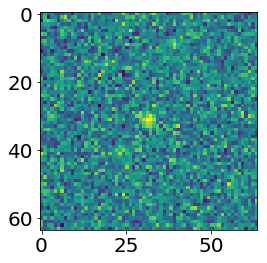

In [267]:
res_out_r_e1 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_r_e2 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e1 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_e2 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_euclid_e1 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')
res_out_lsst_euclid_e2 = np.empty([N,nb_of_samplings*batch_size], dtype='float32')


gal = []
err_count = 0

for i in range (N):
    list_galsim_simple=batch_gen_lsst_euclid.__getitem__(2)
    gal.append(list_galsim_simple[0][1])
    
    plt.imshow(list_galsim_simple[0][0][:,:,6])#
    for k in range (len(list_galsim_simple[0])):
        list_galsim_simple[0][k] = gal[i]
    try: 
        print(i)
        for j in range (nb_of_samplings):
            print(j)
            output_vae_list_r = vae_lsst_r_band_conv.predict(list_galsim_simple[0][:,:,:,6].reshape((batch_size,64,64,1)), batch_size = batch_size)
            output_vae_list_r = output_vae_list_r.reshape((batch_size,64,64))

            output_vae_list_lsst = vae_lsst_conv.predict(list_galsim_simple[0][:,:,:,4:], batch_size = batch_size)
            output_vae_list_lsst = output_vae_list_lsst

            output_vae_list_lsst_euclid = vae_lsst_euclid_conv.predict(list_galsim_simple[0], batch_size = batch_size)
            output_vae_list_lsst_euclid = output_vae_list_lsst_euclid

            for t in range (batch_size):
                img_out_simple = galsim.Image(output_vae_list_r[t])
                res_out_r_e1[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e1
                res_out_r_e2[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e2

                img_out_simple = galsim.Image(output_vae_list_lsst[t,:,:,2])
                res_out_lsst_e1[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e1
                res_out_lsst_e2[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e2

                img_out_simple = galsim.Image(output_vae_list_lsst_euclid[t,:,:,6])
                res_out_lsst_euclid_e1[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e1
                res_out_lsst_euclid_e2[i,j*batch_size+t] = galsim.hsm.EstimateShear(img_out_simple,final_epsf_image).observed_shape.e2
            
    except :
        err_count +=1
        print('erreur')
        pass
    continue
            
print(err_count)

In [269]:
res_in_e1 = np.empty([N], dtype='float32')
res_in_e2 = np.empty([N], dtype='float32')

for k in range (N):
#    try: 
    img_in_simple = galsim.Image(gal[k][:,:,6])
    res_in_e1[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e1
    res_in_e2[k] = galsim.hsm.EstimateShear(img_in_simple,final_epsf_image).observed_shape.e2
    print(res_in_e1[k], res_in_e2[k])

0.023879027 -0.26258844
0.17723005 -0.19179021
-0.29881474 -0.59689546


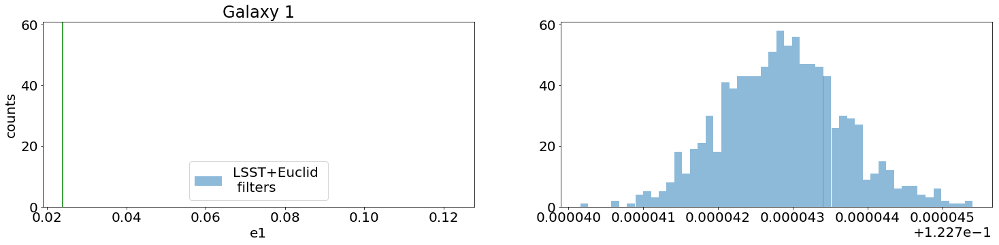

In [278]:
fig, axes = plt.subplots(1,2, figsize=(25,5))

ax = axes[0]
_ = ax.hist(res_out_lsst_euclid_e1[0], bins = 50,label = 'LSST+Euclid \n filters' ,  alpha = 0.5)

ax.axvline(res_in_e1[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e1')
ax.legend()

ax = axes[1]
_ = ax.hist(res_out_lsst_euclid_e1[0] , bins = 50, label = 'LSST+Euclid \n filters' , alpha = 0.5)



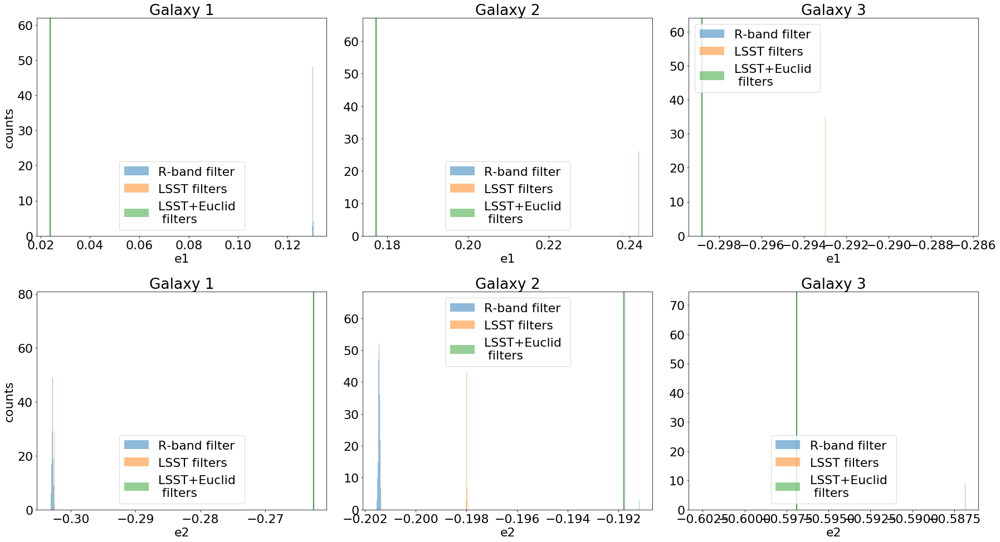

In [270]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)


fig, axes = plt.subplots(2,3, figsize=(25,14))

ax = axes[0,0]
_ = ax.hist(res_out_r_e1[0],  bins = 50, label = 'R-band filter',alpha = 0.5)
_ = ax.hist(res_out_lsst_e1[0], bins = 50,label ='LSST filters' ,  alpha = 0.5)
_ = ax.hist(res_out_lsst_euclid_e1[0], bins = 50,label = 'LSST+Euclid \n filters' ,  alpha = 0.5)
variance = np.var(res_out_r_e1[0])
sigma = np.sqrt(variance)
x = np.linspace(min(res_out_r_e1[0]), max(res_out_r_e1[0]), 100)
#ax.plot(x, mlab.normpdf(x, mean, sigma))


ax.axvline(res_in_e1[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e1')
ax.legend()

ax = axes[0,1]
_ = ax.hist(res_out_r_e1[1] , bins = 50, label = 'R-band filter',alpha = 0.5)
_ = ax.hist(res_out_lsst_e1[1] , bins = 50, label ='LSST filters' , alpha = 0.5)
_ = ax.hist(res_out_lsst_euclid_e1[1] , bins = 50, label = 'LSST+Euclid \n filters' , alpha = 0.5)

ax.axvline(res_in_e1[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e1')
ax.legend()

ax = axes[0,2]
_ = ax.hist(res_out_r_e1[2] , bins = 50, label = 'R-band filter',alpha = 0.5)
_ = ax.hist(res_out_lsst_e1[2] , bins = 50, label ='LSST filters' , alpha = 0.5)
_ = ax.hist(res_out_lsst_euclid_e1[2] , bins = 50,label = 'LSST+Euclid \n filters' ,  alpha = 0.5)

ax.axvline(res_in_e1[2],color='g')
ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e1')
ax.legend()

ax = axes[1,0]
_ = ax.hist(res_out_r_e2[0] , bins = 50, label = 'R-band filter',alpha = 0.5)
_ = ax.hist(res_out_lsst_e2[0] , bins = 50, label ='LSST filters' , alpha = 0.5)
_ = ax.hist(res_out_lsst_euclid_e2[0] , bins = 50, label = 'LSST+Euclid \n filters' , alpha = 0.5)

ax.axvline(res_in_e2[0],color='g')
ax.set_title('Galaxy ' + str(1))
ax.set_ylabel('counts')
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,1]
_ = ax.hist(res_out_r_e2[1] , bins = 50, label = 'R-band filter',alpha = 0.5)
_ = ax.hist(res_out_lsst_e2[1] , bins = 50, label ='LSST filters' , alpha = 0.5)
_ = ax.hist(res_out_lsst_euclid_e2[1] , bins = 50, label = 'LSST+Euclid \n filters' , alpha = 0.5)

ax.axvline(res_in_e2[1],color='g')
ax.set_title('Galaxy ' + str(2))
ax.set_xlabel('e2')
ax.legend()

ax = axes[1,2]
_ = ax.hist(res_out_r_e2[2] , bins = 50, label = 'R-band filter',alpha = 0.5)
_ = ax.hist(res_out_lsst_e2[2] , bins = 50, label ='LSST filters' , alpha = 0.5)
_ = ax.hist(res_out_lsst_euclid_e2[2] , bins = 50, label = 'LSST+Euclid \n filters' , alpha = 0.5)

ax.axvline(res_in_e2[2],color='g')
ax.set_title('Galaxy ' + str(3))
ax.set_xlabel('e2')
ax.legend()

plt.tight_layout()

NameError: name 'ellipticities_test' is not defined

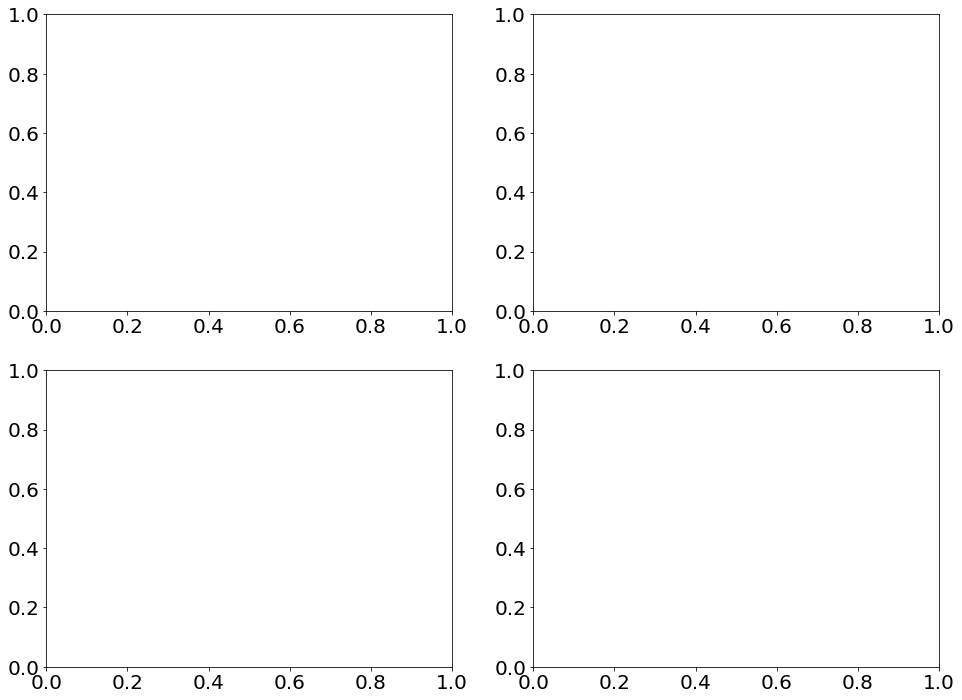

In [271]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 20}

matplotlib.rc('font', **font)


fig, axes = plt.subplots(2, 2, figsize=(16, 12))
_ = axes[0,0].hist(ellipticities_test[:,0,0], bins = 100 , histtype='stepfilled')
axes[0,0].set_title('e1 distribution LSST')
axes[0,0].set_ylim(0, 65)
_ = axes[0,1].hist(ellipticities_test[:,1,0], bins = 100 , histtype='stepfilled')
axes[0,1].set_title('e1 distribution VIS (Euclid)')
axes[0,1].set_ylim(0, 65)
_ = axes[1,0].hist(ellipticities_test[:,0,1], bins = 100 , histtype='stepfilled')
axes[1,0].set_title('e2 distribution LSST')
axes[1,0].set_ylim(0, 65)
_ = axes[1,1].hist(ellipticities_test[:,1,1], bins = 100 , histtype='stepfilled')
axes[1,1].set_title('e2 distribution VIS (Euclid)')
axes[1,1].set_ylim(0, 65)

## Comparison with VAE R filter only

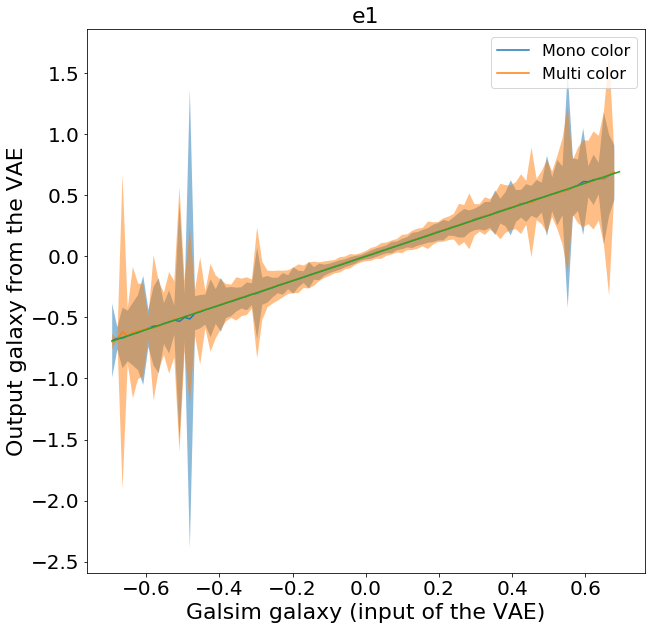

In [200]:
plt.figure(figsize=(10,10))

bins = np.linspace(-0.7, 0.7, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(ellipticities_r_band[:,0,0],ellipticities_r_band[:,1,0],bins)
mean_multi, var_multi = mean_var(ellipticities_LSST[:,0,0],ellipticities_LSST[:,1,0],bins)

plt.plot(mid, mean_simple, label = 'Mono color')
plt.plot(mid, mean_multi, label = 'Multi color')
plt.fill_between(mid, mean_simple - 100*var_simple**0.5, mean_simple + 100*var_simple**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 100*var_multi**0.5, mean_multi + 100*var_multi**0.5, alpha=0.5)
plt.ylabel('Output galaxy from the VAE', fontsize = 22)
plt.xlabel('Galsim galaxy (input of the VAE)', fontsize = 22)
plt.title('e1', fontsize = 22)
plt.legend(fontsize = 16)

plt.plot(mid, mid)

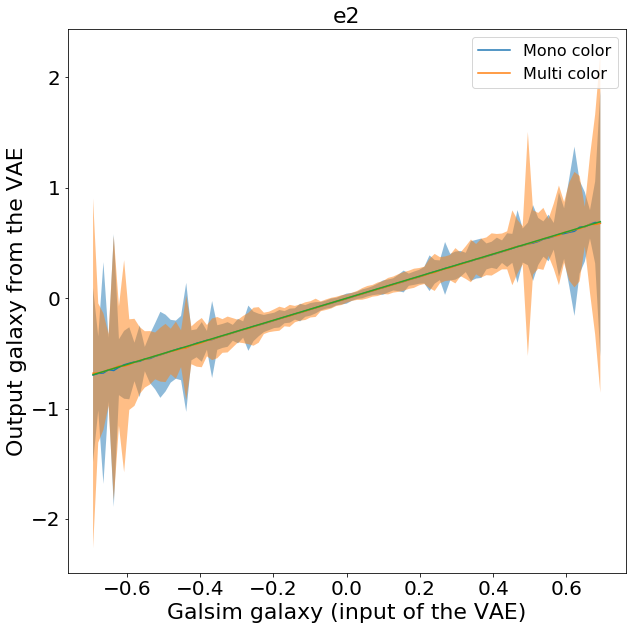

In [201]:
plt.figure(figsize=(10,10))

bins = np.linspace(-0.7, 0.7, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(ellipticities_r_band[:,0,1],ellipticities_r_band[:,1,1],bins)
mean_multi, var_multi = mean_var(ellipticities_LSST[:,0,1],ellipticities_LSST[:,1,1],bins)

plt.plot(mid, mean_simple, label = 'Mono color')
#plt.plot(mid, mean_multi)
plt.plot(mid, mean_multi, label = 'Multi color')
plt.fill_between(mid, mean_simple - 100*var_simple**0.5, mean_simple + 100*var_simple**0.5, alpha=0.5)
#plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 100*var_multi**0.5, mean_multi + 100*var_multi**0.5, alpha=0.5)
plt.ylabel('Output galaxy from the VAE', fontsize = 22)
plt.xlabel('Galsim galaxy (input of the VAE)', fontsize = 22)
plt.title('e2', fontsize = 22)
plt.legend(fontsize = 16)
plt.plot(mid, mid)

#### LSST compared to LSST+EUCLID

/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in sqrt
  


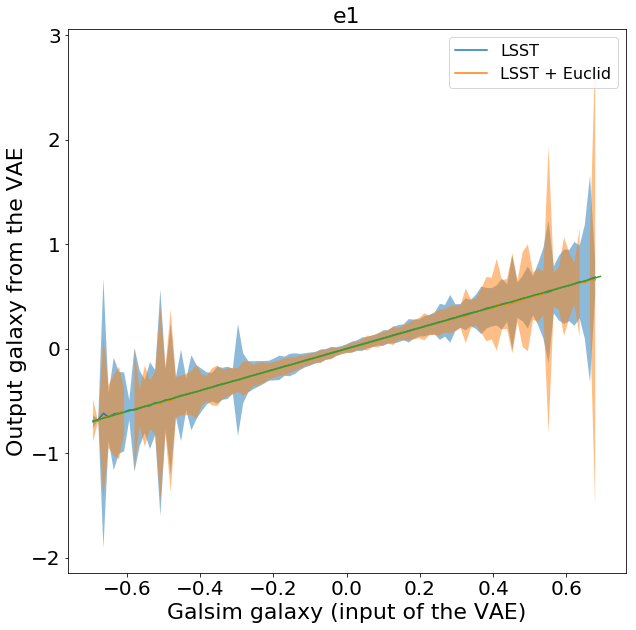

In [202]:
plt.figure(figsize=(10,10))

bins = np.linspace(-0.7, 0.7, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(ellipticities_LSST[:,0,0],ellipticities_LSST[:,1,0],bins)
mean_multi, var_multi = mean_var(ellipticities_LSST_euclid[:,0,0],ellipticities_LSST_euclid[:,1,0],bins)

plt.plot(mid, mean_simple, label = 'LSST')
#plt.plot(mid, mean_multi)
plt.plot(mid, mean_multi, label = 'LSST + Euclid')
plt.fill_between(mid, mean_simple - 100*var_simple**0.5, mean_simple + 100*var_simple**0.5, alpha=0.5)
#plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 100*var_multi**0.5, mean_multi + 100*var_multi**0.5, alpha=0.5)
plt.ylabel('Output galaxy from the VAE', fontsize = 22)
plt.xlabel('Galsim galaxy (input of the VAE)', fontsize = 22)
plt.title('e1', fontsize = 22)
plt.legend(fontsize = 16)

#plt.spines['bottom'].set_color('w')
#plt.spines['right'].set_color('w')
#plt.spines['left'].set_color('w')
#plt.spines['top'].set_color('w')
#plt.xaxis.label.set_color('w')
#plt.tick_params(axis='x', colors='w')
#plt.tick_params(axis='y', colors='w')

plt.plot(mid, mid)

/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in sqrt
  


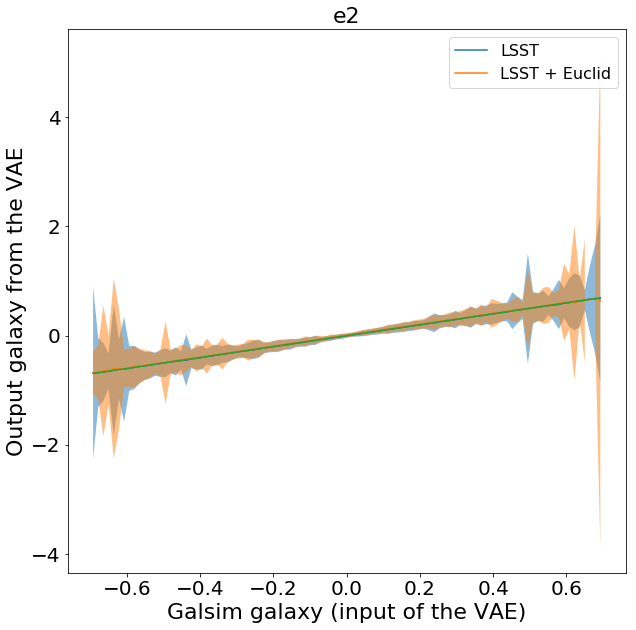

In [205]:
plt.figure(figsize=(10,10))

bins = np.linspace(-0.7, 0.7, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(ellipticities_LSST[:,0,1],ellipticities_LSST[:,1,1],bins)
mean_multi, var_multi = mean_var(ellipticities_LSST_euclid[:,0,1],ellipticities_LSST_euclid[:,1,1],bins)

plt.plot(mid, mean_simple, label = 'LSST')
#plt.plot(mid, mean_multi)
plt.plot(mid, mean_multi, label = 'LSST + Euclid')
plt.fill_between(mid, mean_simple - 100*var_simple**0.5, mean_simple + 100*var_simple**0.5, alpha=0.5)
#plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 100*var_multi**0.5, mean_multi + 100*var_multi**0.5, alpha=0.5)
plt.ylabel('Output galaxy from the VAE', fontsize = 22)
plt.xlabel('Galsim galaxy (input of the VAE)', fontsize = 22)
plt.title('e2', fontsize = 22)
plt.legend(fontsize = 16)
plt.plot(mid, mid)

## Flux comparison

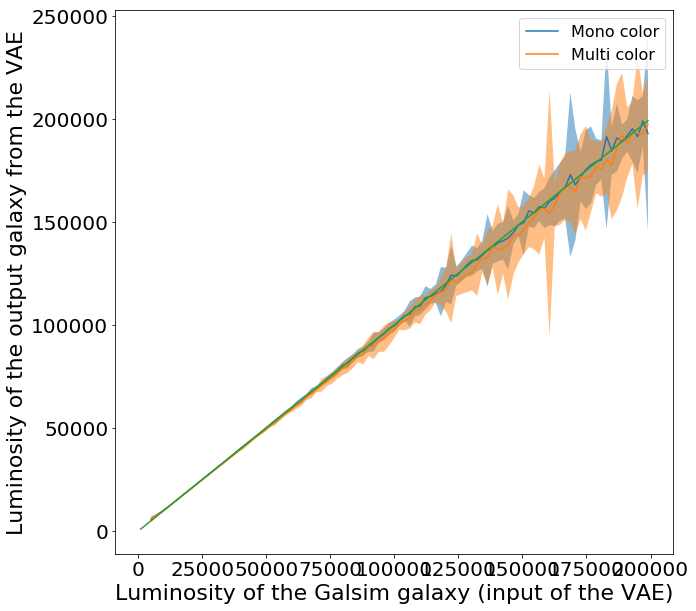

In [287]:
plt.figure(figsize=(10,10))

bins = np.linspace(10., 200000, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(lum_in_simple_r,lum_out_simple_r,bins)
mean_multi, var_multi = mean_var(lum_in_simple_lsst,lum_out_simple_lsst,bins)

plt.plot(mid, mean_simple, label = 'Mono color')
#plt.plot(mid, mean_multi)
plt.plot(mid, mean_multi, label = 'Multi color')
plt.fill_between(mid, mean_simple - 10*var_simple**0.5, mean_simple + 10*var_simple**0.5, alpha=0.5)
#plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.ylabel('Luminosity of the output galaxy from the VAE', fontsize = 22)
plt.xlabel('Luminosity of the Galsim galaxy (input of the VAE)', fontsize = 22)
plt.legend(fontsize = 16)
plt.plot(mid, mid)

/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in sqrt
  if sys.path[0] == '':
/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in sqrt
  


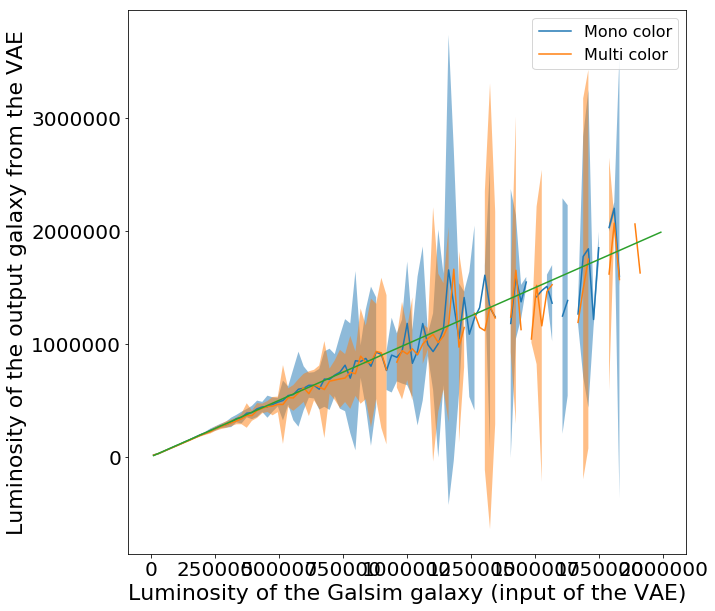

In [286]:
plt.figure(figsize=(10,10))

bins = np.linspace(10., 2000000, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(lum_in_simple_r,lum_out_simple_r,bins)
mean_multi, var_multi = mean_var(lum_in_simple_lsst,lum_out_simple_lsst,bins)

plt.plot(mid, mean_simple, label = 'Mono color')
#plt.plot(mid, mean_multi)
plt.plot(mid, mean_multi, label = 'Multi color')
plt.fill_between(mid, mean_simple - 10*var_simple**0.5, mean_simple + 10*var_simple**0.5, alpha=0.5)
#plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.ylabel('Luminosity of the output galaxy from the VAE', fontsize = 22)
plt.xlabel('Luminosity of the Galsim galaxy (input of the VAE)', fontsize = 22)
plt.legend(fontsize = 16)
plt.plot(mid, mid)

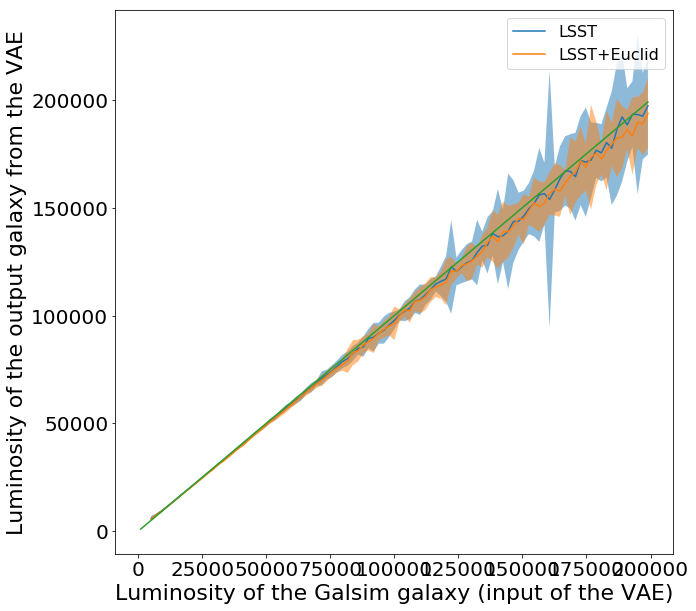

In [290]:
plt.figure(figsize=(10,10))

bins = np.linspace(10., 200000, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(lum_in_simple_lsst,lum_out_simple_lsst,bins)
mean_multi, var_multi = mean_var(lum_in_simple_lsst_euclid,lum_out_simple_lsst_euclid,bins)

plt.plot(mid, mean_simple, label = 'LSST')
#plt.plot(mid, mean_multi)
plt.plot(mid, mean_multi, label = 'LSST+Euclid')
plt.fill_between(mid, mean_simple - 10*var_simple**0.5, mean_simple + 10*var_simple**0.5, alpha=0.5)
#plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.ylabel('Luminosity of the output galaxy from the VAE', fontsize = 22)
plt.xlabel('Luminosity of the Galsim galaxy (input of the VAE)', fontsize = 22)
plt.legend(fontsize = 16)
plt.plot(mid, mid)

/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in sqrt
  if sys.path[0] == '':
/sps/lsst/users/barcelin/miniconda/envs/python_cpu4/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in sqrt
  


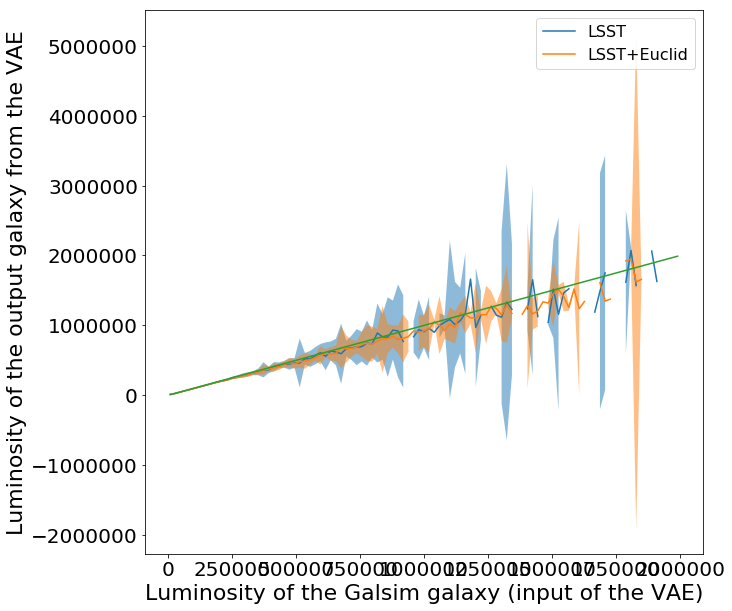

In [291]:
plt.figure(figsize=(10,10))

bins = np.linspace(10., 2000000, 100)
mid = (bins[1:]+bins[:-1])*0.5

mean_simple, var_simple = mean_var(lum_in_simple_lsst,lum_out_simple_lsst,bins)
mean_multi, var_multi = mean_var(lum_in_simple_lsst_euclid,lum_out_simple_lsst_euclid,bins)

plt.plot(mid, mean_simple, label = 'LSST')
#plt.plot(mid, mean_multi)
plt.plot(mid, mean_multi, label = 'LSST+Euclid')
plt.fill_between(mid, mean_simple - 10*var_simple**0.5, mean_simple + 10*var_simple**0.5, alpha=0.5)
#plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.fill_between(mid, mean_multi - 10*var_multi**0.5, mean_multi + 10*var_multi**0.5, alpha=0.5)
plt.ylabel('Luminosity of the output galaxy from the VAE', fontsize = 22)
plt.xlabel('Luminosity of the Galsim galaxy (input of the VAE)', fontsize = 22)
plt.legend(fontsize = 16)
plt.plot(mid, mid)